In [1]:
import pandas as pd
# Specify the file path
file_path = "Bird_Monitoring_Data_GRASSLAND.XLSX"

# Read the Excel file with multiple sheets
excel_data = pd.ExcelFile(file_path, engine='openpyxl')

# Get all sheet names
sheet_names = excel_data.sheet_names

# Read data from all sheets into a dictionary
sheets_dict = {sheet: excel_data.parse(sheet) for sheet in sheet_names}

# Example: Convert sheets_dict to a single DataFrame; this will add a new sheet column at the last.
bird_grassland_df = pd.concat(
    [df.assign(Sheet=sheet_name) for sheet_name, df in sheets_dict.items()],
    ignore_index=True
)

C:\Users\BHAVATHARANI\AppData\Local\Temp\ipykernel_12580\3856836617.py:15: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  bird_grassland_df = pd.concat(


In [2]:
bird_grassland_df.shape

(8531, 30)

In [3]:
bird_grassland_df.head()

,Admin_Unit_Code,Sub_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,...,PIF_Watchlist_Status,Regional_Stewardship_Status,Temperature,Humidity,Sky,Wind,Disturbance,Previously_Obs,Initial_Three_Min_Cnt,Sheet
0,ANTI,NaN,ANTI-0054,Grassland,2018,2018-05-22,05:35:00,05:45:00,Elizabeth Oswald,1,...,False,False,20.0,79.0,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,False,True,ANTI
1,ANTI,NaN,ANTI-0054,Grassland,2018,2018-05-22,05:35:00,05:45:00,Elizabeth Oswald,1,...,False,False,20.0,79.0,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,False,False,ANTI
2,ANTI,NaN,ANTI-0054,Grassland,2018,2018-05-22,05:35:00,05:45:00,Elizabeth Oswald,1,...,False,False,20.0,79.0,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,False,True,ANTI
3,ANTI,NaN,ANTI-0054,Grassland,2018,2018-05-22,05:35:00,05:45:00,Elizabeth Oswald,1,...,False,False,20.0,79.0,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,False,True,ANTI
4,ANTI,NaN,ANTI-0054,Grassland,2018,2018-05-22,05:35:00,05:45:00,Elizabeth Oswald,1,...,False,True,20.0,79.0,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,False,True,ANTI


In [4]:
copy_one_data = bird_grassland_df

In [5]:
duplicates_shows = copy_one_data[copy_one_data.duplicated()]
print(duplicates_shows)

     Admin_Unit_Code Sub_Unit_Code  Plot_Name Location_Type  Year       Date  \
7               ANTI           NaN  ANTI-0054     Grassland  2018 2018-05-22   
26              ANTI           NaN  ANTI-0028     Grassland  2018 2018-05-22   
40              ANTI           NaN  ANTI-0027     Grassland  2018 2018-05-22   
48              ANTI           NaN  ANTI-0027     Grassland  2018 2018-05-22   
52              ANTI           NaN  ANTI-0027     Grassland  2018 2018-05-22   
...              ...           ...        ...           ...   ...        ...   
8526            MONO           NaN  MONO-0089     Grassland  2018 2018-05-10   
8527            MONO           NaN  MONO-0089     Grassland  2018 2018-05-10   
8528            MONO           NaN  MONO-0089     Grassland  2018 2018-05-10   
8529            MONO           NaN  MONO-0089     Grassland  2018 2018-05-10   
8530            MONO           NaN  MONO-0089     Grassland  2018 2018-05-10   

     Start_Time  End_Time          Obse

In [6]:
# drop duplicate columns
grassland_df = copy_one_data.drop_duplicates()
print(grassland_df)

     Admin_Unit_Code Sub_Unit_Code  Plot_Name Location_Type  Year       Date  \
0               ANTI           NaN  ANTI-0054     Grassland  2018 2018-05-22   
1               ANTI           NaN  ANTI-0054     Grassland  2018 2018-05-22   
2               ANTI           NaN  ANTI-0054     Grassland  2018 2018-05-22   
3               ANTI           NaN  ANTI-0054     Grassland  2018 2018-05-22   
4               ANTI           NaN  ANTI-0054     Grassland  2018 2018-05-22   
...              ...           ...        ...           ...   ...        ...   
8514            MONO           NaN  MONO-0089     Grassland  2018 2018-05-10   
8515            MONO           NaN  MONO-0089     Grassland  2018 2018-05-10   
8516            MONO           NaN  MONO-0089     Grassland  2018 2018-05-10   
8517            MONO           NaN  MONO-0089     Grassland  2018 2018-05-10   
8521            MONO           NaN  MONO-0089     Grassland  2018 2018-05-10   

     Start_Time  End_Time          Obse

In [7]:
# drop column
bird_data_land = grassland_df.drop(['Sub_Unit_Code','Previously_Obs','AcceptedTSN','TaxonCode','Initial_Three_Min_Cnt'],axis=1)

In [8]:
bird_data_land.head()

,Admin_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,Interval_Length,...,Scientific_Name,AOU_Code,PIF_Watchlist_Status,Regional_Stewardship_Status,Temperature,Humidity,Sky,Wind,Disturbance,Sheet
0,ANTI,ANTI-0054,Grassland,2018,2018-05-22,05:35:00,05:45:00,Elizabeth Oswald,1,0-2.5 min,...,Spizella passerina,CHSP,False,False,20.0,79.0,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI
1,ANTI,ANTI-0054,Grassland,2018,2018-05-22,05:35:00,05:45:00,Elizabeth Oswald,1,7.5 - 10 min,...,Sialia sialis,EABL,False,False,20.0,79.0,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI
2,ANTI,ANTI-0054,Grassland,2018,2018-05-22,05:35:00,05:45:00,Elizabeth Oswald,1,0-2.5 min,...,Ammodramus savannarum,GRSP,False,False,20.0,79.0,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI
3,ANTI,ANTI-0054,Grassland,2018,2018-05-22,05:35:00,05:45:00,Elizabeth Oswald,1,0-2.5 min,...,Sialia sialis,EABL,False,False,20.0,79.0,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI
4,ANTI,ANTI-0054,Grassland,2018,2018-05-22,05:35:00,05:45:00,Elizabeth Oswald,1,0-2.5 min,...,Spizella pusilla,FISP,False,True,20.0,79.0,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI


In [9]:
bird_data_land.dtypes

Admin_Unit_Code                        object
Plot_Name                              object
Location_Type                          object
Year                                   object
Date                           datetime64[ns]
Start_Time                             object
End_Time                               object
Observer                               object
Visit                                  object
Interval_Length                        object
ID_Method                              object
Distance                               object
Flyover_Observed                       object
Sex                                    object
Common_Name                            object
Scientific_Name                        object
AOU_Code                               object
PIF_Watchlist_Status                   object
Regional_Stewardship_Status            object
Temperature                           float64
Humidity                              float64
Sky                               

In [10]:
# converting datatypes
bird_data_land['Year'] = bird_data_land['Year'].astype('int')
bird_data_land['Start_Time'] = pd.to_datetime(bird_data_land['Start_Time'], format = '%H:%M:%S')
bird_data_land['End_Time'] = pd.to_datetime(bird_data_land['End_Time'], format = '%H:%M:%S')
bird_data_land['Visit'] = bird_data_land['Visit'].astype('int')
bird_data_land['Temperature'] = bird_data_land['Temperature'].astype('int')
bird_data_land['Humidity'] = bird_data_land['Humidity'].astype('int')
bird_data_land['Flyover_Observed'] = bird_data_land['Flyover_Observed'].astype('bool')
bird_data_land['PIF_Watchlist_Status'] = bird_data_land['PIF_Watchlist_Status'].astype('bool')
bird_data_land['Regional_Stewardship_Status'] = bird_data_land['Regional_Stewardship_Status'].astype('bool')


In [11]:
# Removed "min" from interval_length
bird_data_land['Interval_Length'] = bird_data_land['Interval_Length'].str.replace("min","")

# split the Interval_Length into two column
inter_len = bird_data_land['Interval_Length'].str.split("-", expand=True)
# inter_len

# assign correct columns to interval_start and interval_end 
bird_data_land['Interval_Start'] = inter_len[0]
bird_data_land['Interval_End'] = inter_len[1]

# converting interval_start and interval_end to float
bird_data_land['Interval_Start'] = bird_data_land['Interval_Start'].astype('float')
bird_data_land['Interval_End'] = bird_data_land['Interval_End'].astype('float')

# drop the interval_length column
bird_data_land = bird_data_land.drop('Interval_Length',axis=1)

In [12]:
# replace "<="" to "0" from distance
bird_data_land['Distance'] = bird_data_land['Distance'].str.replace("<=","0")
bird_data_land['Distance'] = bird_data_land['Distance'].str.replace("0 50","0-50")

# Removed "Meters" from distance
bird_data_land['Distance'] = bird_data_land['Distance'].str.replace("Meters","")


# split the Distance into two column
dis_meter = bird_data_land['Distance'].str.split("-", expand=True)
# dis_meter

# assign correct columns to interval_start and interval_end 
bird_data_land['Distance_Start'] = dis_meter[0]
bird_data_land['Distance_End'] = dis_meter[1]

# converting interval_start and interval_end to float
bird_data_land['Distance_Start'] = bird_data_land['Distance_Start'].astype('Int64')
bird_data_land['Distance_End'] = bird_data_land['Distance_End'].astype('Int64')

# drop the interval_length column
bird_data_land = bird_data_land.drop('Distance',axis=1)

In [13]:
bird_data_land.dtypes

Admin_Unit_Code                        object
Plot_Name                              object
Location_Type                          object
Year                                    int64
Date                           datetime64[ns]
Start_Time                     datetime64[ns]
End_Time                       datetime64[ns]
Observer                               object
Visit                                   int64
ID_Method                              object
Flyover_Observed                         bool
Sex                                    object
Common_Name                            object
Scientific_Name                        object
AOU_Code                               object
PIF_Watchlist_Status                     bool
Regional_Stewardship_Status              bool
Temperature                             int64
Humidity                                int64
Sky                                    object
Wind                                   object
Disturbance                       

In [14]:
bird_data_land.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6826 entries, 0 to 8521
Data columns (total 27 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Admin_Unit_Code              6826 non-null   object        
 1   Plot_Name                    6826 non-null   object        
 2   Location_Type                6826 non-null   object        
 3   Year                         6826 non-null   int64         
 4   Date                         6826 non-null   datetime64[ns]
 5   Start_Time                   6826 non-null   datetime64[ns]
 6   End_Time                     6826 non-null   datetime64[ns]
 7   Observer                     6826 non-null   object        
 8   Visit                        6826 non-null   int64         
 9   ID_Method                    6825 non-null   object        
 10  Flyover_Observed             6826 non-null   bool          
 11  Sex                          6826 non-null   obj

In [15]:
# To see null row in id_method column
bird_data_land[bird_data_land['ID_Method'].isnull()]

,Admin_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,ID_Method,...,Temperature,Humidity,Sky,Wind,Disturbance,Sheet,Interval_Start,Interval_End,Distance_Start,Distance_End
1904,ANTI,ANTI-0140,Grassland,2018,2018-06-26,1900-01-01 09:38:00,1900-01-01 09:48:00,Kimberly Serno,2,NaN,...,29,50,Partly Cloudy,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,7.5,10.0,<NA>,<NA>


In [16]:
# droped null row in ID_method column
bird_data_land.dropna(subset=['ID_Method'],inplace=True)

In [17]:
# Print number of missing values
missing_value_counts=bird_data_land.isnull().sum()
missing_value_counts

Admin_Unit_Code                  0
Plot_Name                        0
Location_Type                    0
Year                             0
Date                             0
Start_Time                       0
End_Time                         0
Observer                         0
Visit                            0
ID_Method                        0
Flyover_Observed                 0
Sex                              0
Common_Name                      0
Scientific_Name                  0
AOU_Code                         0
PIF_Watchlist_Status             0
Regional_Stewardship_Status      0
Temperature                      0
Humidity                         0
Sky                              0
Wind                             0
Disturbance                      0
Sheet                            0
Interval_Start                   0
Interval_End                     0
Distance_Start                 596
Distance_End                   596
dtype: int64

In [18]:
bird_data_land.shape

(6825, 27)

In [19]:
bird_data_land['ID_Method'].value_counts()

ID_Method
Singing          4191
Visualization    1370
Calling          1264
Name: count, dtype: int64

In [20]:
bird_data_land['Distance_Start'].isnull().groupby(bird_data_land['ID_Method']).sum()

ID_Method
Calling            6
Singing            0
Visualization    590
Name: Distance_Start, dtype: int64

In [21]:
mean_val = bird_data_land.loc[bird_data_land['ID_Method'] == 'Visualization', 'Distance_Start'].mean()
mean_val_rounded=round(mean_val)
print(mean_val_rounded)

mask = (bird_data_land['ID_Method'] == 'Visualization') & (bird_data_land['Distance_Start'].isnull())
bird_data_land.loc[mask, 'Distance_Start'] = mean_val_rounded

18


In [22]:
bird_data_land['Distance_End'].isnull().groupby(bird_data_land['ID_Method']).sum()

ID_Method
Calling            6
Singing            0
Visualization    590
Name: Distance_End, dtype: int64

In [23]:
mean_val_end = bird_data_land.loc[bird_data_land['ID_Method'] == 'Visualization', 'Distance_End'].mean()
mean_val_rounded_end=round(mean_val_end)
print(mean_val_rounded_end)

mask_end = (bird_data_land['ID_Method'] == 'Visualization') & (bird_data_land['Distance_End'].isnull())
bird_data_land.loc[mask_end, 'Distance_End'] = mean_val_rounded_end

68


In [24]:
bird_data_land['Distance_End'].isnull().groupby(bird_data_land['ID_Method']).sum()

ID_Method
Calling          6
Singing          0
Visualization    0
Name: Distance_End, dtype: int64

In [25]:
# to see null row in id_method column
bird_data_land[bird_data_land['Distance_End'].isnull()]

,Admin_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,ID_Method,...,Temperature,Humidity,Sky,Wind,Disturbance,Sheet,Interval_Start,Interval_End,Distance_Start,Distance_End
5074,MANA,MANA-0120,Grassland,2018,2018-07-14,1900-01-01 06:55:00,1900-01-01 07:05:00,Kimberly Serno,3,Calling,...,17,81,Clear or Few Clouds,Light air movement (1-3 mph) smoke drifts,Slight effect on count,MANA,0.0,2.5,<NA>,<NA>
5684,MONO,MONO-0032,Grassland,2018,2018-05-10,1900-01-01 06:10:00,1900-01-01 06:20:00,Kimberly Serno,1,Calling,...,17,70,Partly Cloudy,Calm (< 1 mph) smoke rises vertically,Moderate effect on count,MONO,2.5,5.0,<NA>,<NA>
5720,MONO,MONO-0033,Grassland,2018,2018-05-10,1900-01-01 06:27:00,1900-01-01 06:37:00,Kimberly Serno,1,Calling,...,19,58,Cloudy/Overcast,Light air movement (1-3 mph) smoke drifts,Moderate effect on count,MONO,5.0,7.5,<NA>,<NA>
5721,MONO,MONO-0033,Grassland,2018,2018-05-10,1900-01-01 06:27:00,1900-01-01 06:37:00,Kimberly Serno,1,Calling,...,19,58,Cloudy/Overcast,Light air movement (1-3 mph) smoke drifts,Moderate effect on count,MONO,5.0,7.5,<NA>,<NA>
5726,MONO,MONO-0033,Grassland,2018,2018-05-10,1900-01-01 06:27:00,1900-01-01 06:37:00,Kimberly Serno,1,Calling,...,19,58,Cloudy/Overcast,Light air movement (1-3 mph) smoke drifts,Moderate effect on count,MONO,2.5,5.0,<NA>,<NA>
6733,MONO,MONO-0050,Grassland,2018,2018-06-14,1900-01-01 09:17:00,1900-01-01 09:27:00,Kimberly Serno,2,Calling,...,25,56,Partly Cloudy,Light air movement (1-3 mph) smoke drifts,Slight effect on count,MONO,5.0,7.5,<NA>,<NA>


In [26]:
# droped null row in distance_end column
bird_data_land.dropna(subset=['Distance_End'],inplace=True)

In [27]:
# Print number of missing values
missing_value_counts=bird_data_land.isnull().sum()
missing_value_counts

Admin_Unit_Code                0
Plot_Name                      0
Location_Type                  0
Year                           0
Date                           0
Start_Time                     0
End_Time                       0
Observer                       0
Visit                          0
ID_Method                      0
Flyover_Observed               0
Sex                            0
Common_Name                    0
Scientific_Name                0
AOU_Code                       0
PIF_Watchlist_Status           0
Regional_Stewardship_Status    0
Temperature                    0
Humidity                       0
Sky                            0
Wind                           0
Disturbance                    0
Sheet                          0
Interval_Start                 0
Interval_End                   0
Distance_Start                 0
Distance_End                   0
dtype: int64

In [28]:
bird_data_land.shape

(6819, 27)

In [29]:
bird_data_land.head()

,Admin_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,ID_Method,...,Temperature,Humidity,Sky,Wind,Disturbance,Sheet,Interval_Start,Interval_End,Distance_Start,Distance_End
0,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100
1,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,7.5,10.0,50,100
2,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,0,50
3,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100
4,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100


In [30]:
bird_data_land.dtypes

Admin_Unit_Code                        object
Plot_Name                              object
Location_Type                          object
Year                                    int64
Date                           datetime64[ns]
Start_Time                     datetime64[ns]
End_Time                       datetime64[ns]
Observer                               object
Visit                                   int64
ID_Method                              object
Flyover_Observed                         bool
Sex                                    object
Common_Name                            object
Scientific_Name                        object
AOU_Code                               object
PIF_Watchlist_Status                     bool
Regional_Stewardship_Status              bool
Temperature                             int64
Humidity                                int64
Sky                                    object
Wind                                   object
Disturbance                       

In [31]:
import pandas as pd
# Specify the file path
file_path = "Bird_Monitoring_Data_FOREST.XLSX"

# Read the Excel file with multiple sheets
excel_data = pd.ExcelFile(file_path, engine='openpyxl')

# Get all sheet names
sheet_names = excel_data.sheet_names

# Read data from all sheets into a dictionary
sheets_dict = {sheet: excel_data.parse(sheet) for sheet in sheet_names}

# Example: Convert sheets_dict to a single DataFrame; this will add a new sheet column at the last.
bird_forest_df = pd.concat(
    [df.assign(Sheet=sheet_name) for sheet_name, df in sheets_dict.items()],
    ignore_index=True
)

In [32]:
bird_forest_df.shape

(8546, 30)

In [33]:
bird_forest_df.head()


,Admin_Unit_Code,Sub_Unit_Code,Site_Name,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,...,AOU_Code,PIF_Watchlist_Status,Regional_Stewardship_Status,Temperature,Humidity,Sky,Wind,Disturbance,Initial_Three_Min_Cnt,Sheet
0,ANTI,NaN,ANTI 1,ANTI-0036,Forest,2018,2018-05-22,06:19:00,06:29:00,Elizabeth Oswald,...,EATO,False,True,19.9,79.400002,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,True,ANTI
1,ANTI,NaN,ANTI 1,ANTI-0036,Forest,2018,2018-05-22,06:19:00,06:29:00,Elizabeth Oswald,...,WBNU,False,False,19.9,79.400002,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,True,ANTI
2,ANTI,NaN,ANTI 1,ANTI-0036,Forest,2018,2018-05-22,06:19:00,06:29:00,Elizabeth Oswald,...,RBWO,False,False,19.9,79.400002,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,False,ANTI
3,ANTI,NaN,ANTI 1,ANTI-0036,Forest,2018,2018-05-22,06:19:00,06:29:00,Elizabeth Oswald,...,OROR,False,False,19.9,79.400002,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,False,ANTI
4,ANTI,NaN,ANTI 1,ANTI-0036,Forest,2018,2018-05-22,06:19:00,06:29:00,Elizabeth Oswald,...,NOMO,False,False,19.9,79.400002,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,False,ANTI


In [34]:
copy_two_data = bird_forest_df

In [35]:
duplicates_shows_forest = copy_two_data[copy_two_data.duplicated()]
print(duplicates_shows_forest)

Empty DataFrame
Columns: [Admin_Unit_Code, Sub_Unit_Code, Site_Name, Plot_Name, Location_Type, Year, Date, Start_Time, End_Time, Observer, Visit, Interval_Length, ID_Method, Distance, Flyover_Observed, Sex, Common_Name, Scientific_Name, AcceptedTSN, NPSTaxonCode, AOU_Code, PIF_Watchlist_Status, Regional_Stewardship_Status, Temperature, Humidity, Sky, Wind, Disturbance, Initial_Three_Min_Cnt, Sheet]
Index: []

[0 rows x 30 columns]


In [36]:
forest_df = copy_two_data.drop_duplicates()
print(forest_df)

     Admin_Unit_Code Sub_Unit_Code Site_Name  Plot_Name Location_Type  Year  \
0               ANTI           NaN    ANTI 1  ANTI-0036        Forest  2018   
1               ANTI           NaN    ANTI 1  ANTI-0036        Forest  2018   
2               ANTI           NaN    ANTI 1  ANTI-0036        Forest  2018   
3               ANTI           NaN    ANTI 1  ANTI-0036        Forest  2018   
4               ANTI           NaN    ANTI 1  ANTI-0036        Forest  2018   
...              ...           ...       ...        ...           ...   ...   
8541            WOTR           NaN      WOTR  WOTR-0001        Forest  2018   
8542            WOTR           NaN      WOTR  WOTR-0001        Forest  2018   
8543            WOTR           NaN      WOTR  WOTR-0001        Forest  2018   
8544            WOTR           NaN      WOTR  WOTR-0001        Forest  2018   
8545            WOTR           NaN      WOTR  WOTR-0001        Forest  2018   

           Date Start_Time  End_Time          Obser

In [37]:
bird_data_land.columns

Index(['Admin_Unit_Code', 'Plot_Name', 'Location_Type', 'Year', 'Date',
       'Start_Time', 'End_Time', 'Observer', 'Visit', 'ID_Method',
       'Flyover_Observed', 'Sex', 'Common_Name', 'Scientific_Name', 'AOU_Code',
       'PIF_Watchlist_Status', 'Regional_Stewardship_Status', 'Temperature',
       'Humidity', 'Sky', 'Wind', 'Disturbance', 'Sheet', 'Interval_Start',
       'Interval_End', 'Distance_Start', 'Distance_End'],
      dtype='object')

In [38]:
bird_forest_df.columns

Index(['Admin_Unit_Code', 'Sub_Unit_Code', 'Site_Name', 'Plot_Name',
       'Location_Type', 'Year', 'Date', 'Start_Time', 'End_Time', 'Observer',
       'Visit', 'Interval_Length', 'ID_Method', 'Distance', 'Flyover_Observed',
       'Sex', 'Common_Name', 'Scientific_Name', 'AcceptedTSN', 'NPSTaxonCode',
       'AOU_Code', 'PIF_Watchlist_Status', 'Regional_Stewardship_Status',
       'Temperature', 'Humidity', 'Sky', 'Wind', 'Disturbance',
       'Initial_Three_Min_Cnt', 'Sheet'],
      dtype='object')

In [39]:
# drop column
bird_data_forest = forest_df.drop(['Sub_Unit_Code','Site_Name','AcceptedTSN','NPSTaxonCode','Initial_Three_Min_Cnt'],axis=1)

In [40]:
bird_data_forest.head()

,Admin_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,Interval_Length,...,Scientific_Name,AOU_Code,PIF_Watchlist_Status,Regional_Stewardship_Status,Temperature,Humidity,Sky,Wind,Disturbance,Sheet
0,ANTI,ANTI-0036,Forest,2018,2018-05-22,06:19:00,06:29:00,Elizabeth Oswald,1,0-2.5 min,...,Pipilo erythrophthalmus,EATO,False,True,19.9,79.400002,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,ANTI
1,ANTI,ANTI-0036,Forest,2018,2018-05-22,06:19:00,06:29:00,Elizabeth Oswald,1,0-2.5 min,...,Sitta carolinensis,WBNU,False,False,19.9,79.400002,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,ANTI
2,ANTI,ANTI-0036,Forest,2018,2018-05-22,06:19:00,06:29:00,Elizabeth Oswald,1,2.5 - 5 min,...,Melanerpes carolinus,RBWO,False,False,19.9,79.400002,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,ANTI
3,ANTI,ANTI-0036,Forest,2018,2018-05-22,06:19:00,06:29:00,Elizabeth Oswald,1,2.5 - 5 min,...,Icterus spurius,OROR,False,False,19.9,79.400002,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,ANTI
4,ANTI,ANTI-0036,Forest,2018,2018-05-22,06:19:00,06:29:00,Elizabeth Oswald,1,2.5 - 5 min,...,Mimus polyglottos,NOMO,False,False,19.9,79.400002,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,ANTI


In [41]:
bird_data_land.dtypes

Admin_Unit_Code                        object
Plot_Name                              object
Location_Type                          object
Year                                    int64
Date                           datetime64[ns]
Start_Time                     datetime64[ns]
End_Time                       datetime64[ns]
Observer                               object
Visit                                   int64
ID_Method                              object
Flyover_Observed                         bool
Sex                                    object
Common_Name                            object
Scientific_Name                        object
AOU_Code                               object
PIF_Watchlist_Status                     bool
Regional_Stewardship_Status              bool
Temperature                             int64
Humidity                                int64
Sky                                    object
Wind                                   object
Disturbance                       

In [42]:
bird_data_forest.dtypes

Admin_Unit_Code                        object
Plot_Name                              object
Location_Type                          object
Year                                    int64
Date                           datetime64[ns]
Start_Time                             object
End_Time                               object
Observer                               object
Visit                                   int64
Interval_Length                        object
ID_Method                              object
Distance                               object
Flyover_Observed                         bool
Sex                                    object
Common_Name                            object
Scientific_Name                        object
AOU_Code                               object
PIF_Watchlist_Status                     bool
Regional_Stewardship_Status              bool
Temperature                           float64
Humidity                              float64
Sky                               

In [43]:
# converting datatypes
bird_data_forest['Start_Time'] = pd.to_datetime(bird_data_forest['Start_Time'], format = '%H:%M:%S')
bird_data_forest['End_Time'] = pd.to_datetime(bird_data_forest['End_Time'], format = '%H:%M:%S')
bird_data_forest['Temperature'] = bird_data_forest['Temperature'].astype('int')
bird_data_forest['Humidity'] = bird_data_forest['Humidity'].astype('int')

In [44]:
# Removed "min" from interval_length
bird_data_forest['Interval_Length'] = bird_data_forest['Interval_Length'].str.replace("min","")

# split the Interval_Length into two column
inter_len = bird_data_forest['Interval_Length'].str.split("-", expand=True)
# inter_len

# assign correct columns to interval_start and interval_end 
bird_data_forest['Interval_Start'] = inter_len[0]
bird_data_forest['Interval_End'] = inter_len[1]

# converting interval_start and interval_end to float
bird_data_forest['Interval_Start'] = bird_data_forest['Interval_Start'].astype('float')
bird_data_forest['Interval_End'] = bird_data_forest['Interval_End'].astype('float')

# drop the interval_length column
bird_data_forest = bird_data_forest.drop('Interval_Length',axis=1)

In [45]:
# replace "<="" to "0" from distance
bird_data_forest['Distance'] = bird_data_forest['Distance'].str.replace("<=","0")
bird_data_forest['Distance'] = bird_data_forest['Distance'].str.replace("0 50","0-50")

# Removed "Meters" from distance
bird_data_forest['Distance'] = bird_data_forest['Distance'].str.replace("Meters","")


# split the Distance into two column
dis_meter = bird_data_forest['Distance'].str.split("-", expand=True)
# dis_meter

# assign correct columns to interval_start and interval_end 
bird_data_forest['Distance_Start'] = dis_meter[0]
bird_data_forest['Distance_End'] = dis_meter[1]

# converting interval_start and interval_end to float
bird_data_forest['Distance_Start'] = bird_data_forest['Distance_Start'].astype('Int64')
bird_data_forest['Distance_End'] = bird_data_forest['Distance_End'].astype('Int64')

# drop the interval_length column
bird_data_forest = bird_data_forest.drop('Distance',axis=1)

In [46]:
bird_data_forest.dtypes


Admin_Unit_Code                        object
Plot_Name                              object
Location_Type                          object
Year                                    int64
Date                           datetime64[ns]
Start_Time                     datetime64[ns]
End_Time                       datetime64[ns]
Observer                               object
Visit                                   int64
ID_Method                              object
Flyover_Observed                         bool
Sex                                    object
Common_Name                            object
Scientific_Name                        object
AOU_Code                               object
PIF_Watchlist_Status                     bool
Regional_Stewardship_Status              bool
Temperature                             int64
Humidity                                int64
Sky                                    object
Wind                                   object
Disturbance                       

In [47]:
bird_data_forest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8546 entries, 0 to 8545
Data columns (total 27 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Admin_Unit_Code              8546 non-null   object        
 1   Plot_Name                    8546 non-null   object        
 2   Location_Type                8546 non-null   object        
 3   Year                         8546 non-null   int64         
 4   Date                         8546 non-null   datetime64[ns]
 5   Start_Time                   8546 non-null   datetime64[ns]
 6   End_Time                     8546 non-null   datetime64[ns]
 7   Observer                     8546 non-null   object        
 8   Visit                        8546 non-null   int64         
 9   ID_Method                    8545 non-null   object        
 10  Flyover_Observed             8546 non-null   bool          
 11  Sex                          3363 non-null 

In [48]:
# Print number of missing values
missing_value_counts_forest=bird_data_forest.isnull().sum()
missing_value_counts_forest

Admin_Unit_Code                   0
Plot_Name                         0
Location_Type                     0
Year                              0
Date                              0
Start_Time                        0
End_Time                          0
Observer                          0
Visit                             0
ID_Method                         1
Flyover_Observed                  0
Sex                            5183
Common_Name                       0
Scientific_Name                   0
AOU_Code                          0
PIF_Watchlist_Status              0
Regional_Stewardship_Status       0
Temperature                       0
Humidity                          0
Sky                               0
Wind                              0
Disturbance                       0
Sheet                             0
Interval_Start                    0
Interval_End                      0
Distance_Start                   92
Distance_End                     92
dtype: int64

In [49]:
bird_data_forest['Sex'].unique()

array(['Undetermined', nan, 'Male'], dtype=object)

In [50]:
# convert null to undetermined in sex column
bird_data_forest['Sex'] = bird_data_forest['Sex'].fillna('Undetermined')

In [51]:
# To see null row in id_method column
bird_data_forest[bird_data_forest['ID_Method'].isnull()]

,Admin_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,ID_Method,...,Temperature,Humidity,Sky,Wind,Disturbance,Sheet,Interval_Start,Interval_End,Distance_Start,Distance_End
5853,PRWI,PRWI-0051,Forest,2018,2018-06-06,1900-01-01 06:16:00,1900-01-01 06:26:00,Kimberly Serno,1,NaN,...,18,69,Partly Cloudy,Light breeze (4-7 mph) wind felt on face,Slight effect on count,PRWI,7.5,10.0,0,50


In [52]:
# droped null row in ID_method column
bird_data_forest.dropna(subset=['ID_Method'],inplace=True)

In [53]:
# Print number of missing values
missing_value_counts_forest=bird_data_forest.isnull().sum()
missing_value_counts_forest

Admin_Unit_Code                 0
Plot_Name                       0
Location_Type                   0
Year                            0
Date                            0
Start_Time                      0
End_Time                        0
Observer                        0
Visit                           0
ID_Method                       0
Flyover_Observed                0
Sex                             0
Common_Name                     0
Scientific_Name                 0
AOU_Code                        0
PIF_Watchlist_Status            0
Regional_Stewardship_Status     0
Temperature                     0
Humidity                        0
Sky                             0
Wind                            0
Disturbance                     0
Sheet                           0
Interval_Start                  0
Interval_End                    0
Distance_Start                 92
Distance_End                   92
dtype: int64

In [54]:
bird_data_forest['ID_Method'].value_counts()

ID_Method
Singing          5430
Calling          2677
Visualization     438
Name: count, dtype: int64

In [55]:
bird_data_forest['Distance_Start'].isnull().groupby(bird_data_forest['ID_Method']).sum()

ID_Method
Calling           1
Singing           1
Visualization    90
Name: Distance_Start, dtype: int64

In [56]:
mean_val_forest = bird_data_forest.loc[bird_data_forest['ID_Method'] == 'Visualization', 'Distance_Start'].mean()
mean_val_rounded_forest=round(mean_val_forest)
print(mean_val_rounded_forest)

mask_forest = (bird_data_forest['ID_Method'] == 'Visualization') & (bird_data_forest['Distance_Start'].isnull())
bird_data_forest.loc[mask_forest, 'Distance_Start'] = mean_val_rounded_forest

4


In [57]:
bird_data_forest['Distance_End'].isnull().groupby(bird_data_forest['ID_Method']).sum()

ID_Method
Calling           1
Singing           1
Visualization    90
Name: Distance_End, dtype: int64

In [58]:
mean_val_end_forest = bird_data_forest.loc[bird_data_forest['ID_Method'] == 'Visualization', 'Distance_End'].mean()
mean_val_rounded_end_forest=round(mean_val_end_forest)
print(mean_val_rounded_end_forest)

mask_end_forest = (bird_data_forest['ID_Method'] == 'Visualization') & (bird_data_forest['Distance_End'].isnull())
bird_data_forest.loc[mask_end_forest, 'Distance_End'] = mean_val_rounded_end_forest

54


In [59]:
bird_data_forest['Distance_End'].isnull().groupby(bird_data_forest['ID_Method']).sum()

ID_Method
Calling          1
Singing          1
Visualization    0
Name: Distance_End, dtype: int64

In [60]:
# to see null row in id_method column
bird_data_forest[bird_data_forest['Distance_End'].isnull()]

,Admin_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,ID_Method,...,Temperature,Humidity,Sky,Wind,Disturbance,Sheet,Interval_Start,Interval_End,Distance_Start,Distance_End
778,CATO,CATO-0342,Forest,2018,2018-06-20,1900-01-01 08:41:00,1900-01-01 08:51:00,Brian Swimelar,2,Singing,...,24,58,Clear or Few Clouds,Light air movement (1-3 mph) smoke drifts,No effect on count,CATO,0.0,2.5,<NA>,<NA>
5093,NACE,NACE-0649,Forest,2018,2018-05-11,1900-01-01 05:58:00,1900-01-01 06:08:00,Kimberly Serno,1,Calling,...,22,60,Clear or Few Clouds,Calm (< 1 mph) smoke rises vertically,No effect on count,NACE,5.0,7.5,<NA>,<NA>


In [61]:
# droped null row in distance_end column
bird_data_forest.dropna(subset=['Distance_End'],inplace=True)

In [62]:
# Print number of missing values
missing_value_counts_forest=bird_data_forest.isnull().sum()
missing_value_counts_forest

Admin_Unit_Code                0
Plot_Name                      0
Location_Type                  0
Year                           0
Date                           0
Start_Time                     0
End_Time                       0
Observer                       0
Visit                          0
ID_Method                      0
Flyover_Observed               0
Sex                            0
Common_Name                    0
Scientific_Name                0
AOU_Code                       0
PIF_Watchlist_Status           0
Regional_Stewardship_Status    0
Temperature                    0
Humidity                       0
Sky                            0
Wind                           0
Disturbance                    0
Sheet                          0
Interval_Start                 0
Interval_End                   0
Distance_Start                 0
Distance_End                   0
dtype: int64

In [63]:
bird_data_forest.shape

(8543, 27)

In [64]:
bird_data_forest.head()

,Admin_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,ID_Method,...,Temperature,Humidity,Sky,Wind,Disturbance,Sheet,Interval_Start,Interval_End,Distance_Start,Distance_End
0,ANTI,ANTI-0036,Forest,2018,2018-05-22,1900-01-01 06:19:00,1900-01-01 06:29:00,Elizabeth Oswald,1,Singing,...,19,79,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,ANTI,0.0,2.5,0,50
1,ANTI,ANTI-0036,Forest,2018,2018-05-22,1900-01-01 06:19:00,1900-01-01 06:29:00,Elizabeth Oswald,1,Calling,...,19,79,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,ANTI,0.0,2.5,0,50
2,ANTI,ANTI-0036,Forest,2018,2018-05-22,1900-01-01 06:19:00,1900-01-01 06:29:00,Elizabeth Oswald,1,Calling,...,19,79,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,ANTI,2.5,5.0,50,100
3,ANTI,ANTI-0036,Forest,2018,2018-05-22,1900-01-01 06:19:00,1900-01-01 06:29:00,Elizabeth Oswald,1,Singing,...,19,79,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,ANTI,2.5,5.0,0,50
4,ANTI,ANTI-0036,Forest,2018,2018-05-22,1900-01-01 06:19:00,1900-01-01 06:29:00,Elizabeth Oswald,1,Visualization,...,19,79,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,No effect on count,ANTI,2.5,5.0,0,50


In [65]:
bird_data_forest.dtypes

Admin_Unit_Code                        object
Plot_Name                              object
Location_Type                          object
Year                                    int64
Date                           datetime64[ns]
Start_Time                     datetime64[ns]
End_Time                       datetime64[ns]
Observer                               object
Visit                                   int64
ID_Method                              object
Flyover_Observed                         bool
Sex                                    object
Common_Name                            object
Scientific_Name                        object
AOU_Code                               object
PIF_Watchlist_Status                     bool
Regional_Stewardship_Status              bool
Temperature                             int64
Humidity                                int64
Sky                                    object
Wind                                   object
Disturbance                       

In [66]:
# checking the datatypes are same in both dataframes
comparison = bird_data_land.dtypes == bird_data_forest.dtypes
print(comparison)
# bird_data_forest.dtypes.equals(bird_data_land.dtypes)

Admin_Unit_Code                True
Plot_Name                      True
Location_Type                  True
Year                           True
Date                           True
Start_Time                     True
End_Time                       True
Observer                       True
Visit                          True
ID_Method                      True
Flyover_Observed               True
Sex                            True
Common_Name                    True
Scientific_Name                True
AOU_Code                       True
PIF_Watchlist_Status           True
Regional_Stewardship_Status    True
Temperature                    True
Humidity                       True
Sky                            True
Wind                           True
Disturbance                    True
Sheet                          True
Interval_Start                 True
Interval_End                   True
Distance_Start                 True
Distance_End                   True
dtype: bool


In [67]:
bird_data_land.shape

(6819, 27)

In [68]:
# combaained two dataframes
combined_two_df = pd.concat([bird_data_land, bird_data_forest], ignore_index=True)

In [69]:
combined_two_df

,Admin_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,ID_Method,...,Temperature,Humidity,Sky,Wind,Disturbance,Sheet,Interval_Start,Interval_End,Distance_Start,Distance_End
0,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100
1,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,7.5,10.0,50,100
2,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,0,50
3,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100
4,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15357,WOTR,WOTR-0001,Forest,2018,2018-07-08,1900-01-01 08:13:00,1900-01-01 08:23:00,Kimberly Serno,2,Singing,...,20,75,Clear or Few Clouds,Light air movement (1-3 mph) smoke drifts,Slight effect on count,WOTR,0.0,2.5,0,50
15358,WOTR,WOTR-0001,Forest,2018,2018-07-08,1900-01-01 08:13:00,1900-01-01 08:23:00,Kimberly Serno,2,Singing,...,20,75,Clear or Few Clouds,Light air movement (1-3 mph) smoke drifts,Slight effect on count,WOTR,0.0,2.5,0,50
15359,WOTR,WOTR-0001,Forest,2018,2018-07-08,1900-01-01 08:13:00,1900-01-01 08:23:00,Kimberly Serno,2,Singing,...,20,75,Clear or Few Clouds,Light air movement (1-3 mph) smoke drifts,Slight effect on count,WOTR,7.5,10.0,50,100
15360,WOTR,WOTR-0001,Forest,2018,2018-07-08,1900-01-01 08:13:00,1900-01-01 08:23:00,Kimberly Serno,2,Singing,...,20,75,Clear or Few Clouds,Light air movement (1-3 mph) smoke drifts,Slight effect on count,WOTR,0.0,2.5,0,50


In [70]:
# pd.set_option('display.max_columns', None)

In [71]:
duplicates_shows_both = combined_two_df[combined_two_df.duplicated()]
print(duplicates_shows_both)

      Admin_Unit_Code  Plot_Name Location_Type  Year       Date  \
1223             ANTI  ANTI-0028     Grassland  2018 2018-06-25   
6371             MONO  MONO-0037     Grassland  2018 2018-07-11   
8490             CHOH  GWMP-0080        Forest  2018 2018-05-29   
8702             CHOH  CHOH-1111        Forest  2018 2018-06-12   
9052             CHOH  CHOH-1256        Forest  2018 2018-06-13   
9607             CHOH  CHOH-1217        Forest  2018 2018-07-10   
9634             CHOH  CHOH-1226        Forest  2018 2018-07-10   
9821             CHOH  CHOH-1148        Forest  2018 2018-07-10   
10350            GWMP  GWMP-0120        Forest  2018 2018-06-29   
12375            NACE  NACE-0477        Forest  2018 2018-05-11   
13982            PRWI  PRWI-0660        Forest  2018 2018-07-03   
15095            ROCR  ROCR-0004        Forest  2018 2018-06-20   

               Start_Time            End_Time          Observer  Visit  \
1223  1900-01-01 07:36:00 1900-01-01 07:46:00    Kimbe

In [72]:
cleaned_df = combined_two_df.drop_duplicates()
print(cleaned_df)

      Admin_Unit_Code  Plot_Name Location_Type  Year       Date  \
0                ANTI  ANTI-0054     Grassland  2018 2018-05-22   
1                ANTI  ANTI-0054     Grassland  2018 2018-05-22   
2                ANTI  ANTI-0054     Grassland  2018 2018-05-22   
3                ANTI  ANTI-0054     Grassland  2018 2018-05-22   
4                ANTI  ANTI-0054     Grassland  2018 2018-05-22   
...               ...        ...           ...   ...        ...   
15357            WOTR  WOTR-0001        Forest  2018 2018-07-08   
15358            WOTR  WOTR-0001        Forest  2018 2018-07-08   
15359            WOTR  WOTR-0001        Forest  2018 2018-07-08   
15360            WOTR  WOTR-0001        Forest  2018 2018-07-08   
15361            WOTR  WOTR-0001        Forest  2018 2018-07-08   

               Start_Time            End_Time          Observer  Visit  \
0     1900-01-01 05:35:00 1900-01-01 05:45:00  Elizabeth Oswald      1   
1     1900-01-01 05:35:00 1900-01-01 05:45:00  

In [73]:
cleaned_df.shape

(15350, 27)

In [74]:
cleaned_df.dtypes

Admin_Unit_Code                        object
Plot_Name                              object
Location_Type                          object
Year                                    int64
Date                           datetime64[ns]
Start_Time                     datetime64[ns]
End_Time                       datetime64[ns]
Observer                               object
Visit                                   int64
ID_Method                              object
Flyover_Observed                         bool
Sex                                    object
Common_Name                            object
Scientific_Name                        object
AOU_Code                               object
PIF_Watchlist_Status                     bool
Regional_Stewardship_Status              bool
Temperature                             int64
Humidity                                int64
Sky                                    object
Wind                                   object
Disturbance                       

In [75]:
bp=cleaned_df[cleaned_df.duplicated()]
bp

,Admin_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,ID_Method,...,Temperature,Humidity,Sky,Wind,Disturbance,Sheet,Interval_Start,Interval_End,Distance_Start,Distance_End


In [76]:
cleaned_df.head()

,Admin_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,ID_Method,...,Temperature,Humidity,Sky,Wind,Disturbance,Sheet,Interval_Start,Interval_End,Distance_Start,Distance_End
0,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100
1,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,7.5,10.0,50,100
2,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,0,50
3,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100
4,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,20,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100


In [77]:
minmum = cleaned_df['Temperature'].min()
maximum = cleaned_df['Temperature'].max()
print(minmum)
print(maximum)

11
37


<Axes: >

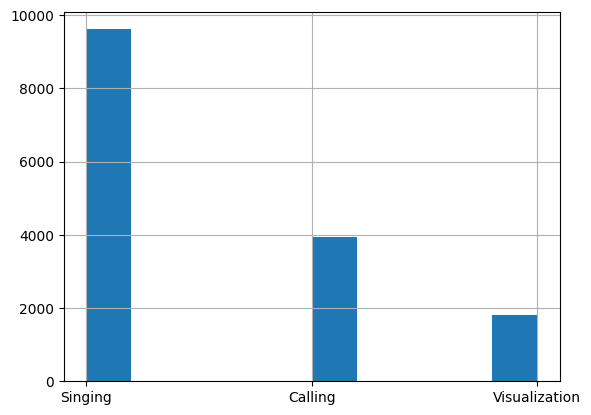

In [78]:
cleaned_df["ID_Method"].hist(bins=10)

<Axes: >

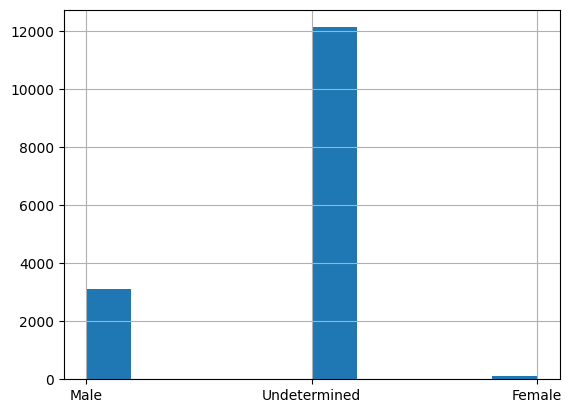

In [79]:
cleaned_df['Sex'].hist(bins=10)

<Axes: >

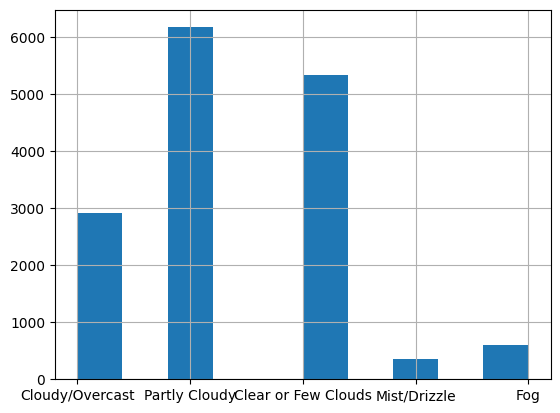

In [80]:
cleaned_df['Sky'].hist(bins=10)

<Axes: >

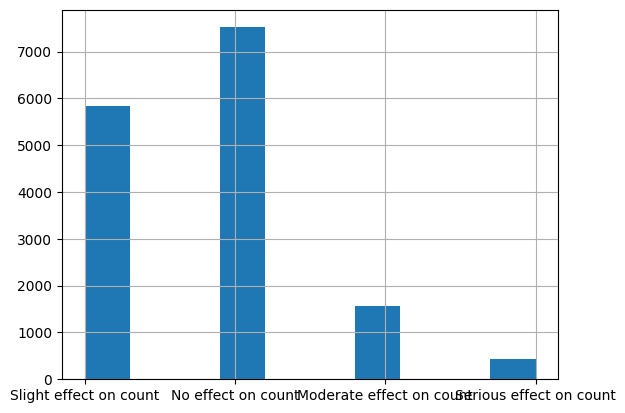

In [81]:
cleaned_df['Disturbance'].hist(bins=10)

<Axes: ylabel='Temperature'>

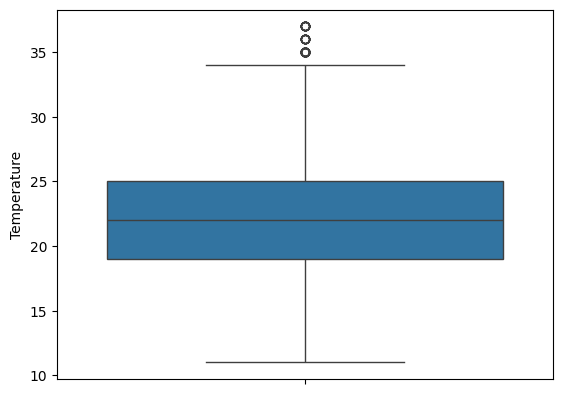

In [82]:
import seaborn as sns
sns.boxplot(cleaned_df["Temperature"])

In [83]:
#Finding the IQR
percentile25 = cleaned_df['Temperature'].quantile(0.25)
percentile75 = cleaned_df['Temperature'].quantile(0.75)

iqr=percentile75 - percentile25
print(iqr)
print(percentile25)
print(percentile75)

6.0
19.0
25.0


In [84]:
#Finding upper and lower limit
upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr
print(upper_limit)
print(lower_limit)

34.0
10.0


In [85]:
print(cleaned_df['Temperature'].describe())

count    15350.000000
mean        22.074267
std          4.198084
min         11.000000
25%         19.000000
50%         22.000000
75%         25.000000
max         37.000000
Name: Temperature, dtype: float64


In [86]:
high_temps = cleaned_df[cleaned_df['Temperature'] > 34]
print(f"Number of values > 34°C: {len(high_temps)}")
print(high_temps)

Number of values > 34°C: 59
     Admin_Unit_Code  Plot_Name Location_Type  Year       Date  \
2328            ANTI  ANTI-0199     Grassland  2018 2018-07-13   
2329            ANTI  ANTI-0199     Grassland  2018 2018-07-13   
2330            ANTI  ANTI-0199     Grassland  2018 2018-07-13   
2331            ANTI  ANTI-0199     Grassland  2018 2018-07-13   
2332            ANTI  ANTI-0199     Grassland  2018 2018-07-13   
2333            ANTI  ANTI-0199     Grassland  2018 2018-07-13   
2334            ANTI  ANTI-0199     Grassland  2018 2018-07-13   
2335            ANTI  ANTI-0199     Grassland  2018 2018-07-13   
2362            ANTI  ANTI-0180     Grassland  2018 2018-07-13   
2363            ANTI  ANTI-0180     Grassland  2018 2018-07-13   
2364            ANTI  ANTI-0180     Grassland  2018 2018-07-13   
2365            ANTI  ANTI-0180     Grassland  2018 2018-07-13   
2366            ANTI  ANTI-0180     Grassland  2018 2018-07-13   
2367            ANTI  ANTI-0180     Grassland  2

In [87]:
corr_matrix = cleaned_df[['Temperature', 'Humidity']].corr()
print(corr_matrix)

             Temperature  Humidity
Temperature     1.000000 -0.342268
Humidity       -0.342268  1.000000


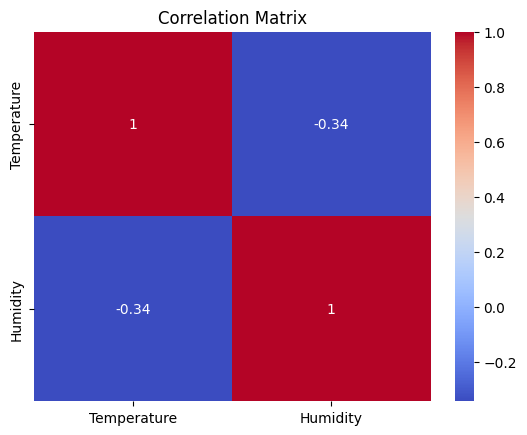

In [88]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [89]:
cleaned_df['Sky'].unique()

array(['Cloudy/Overcast', 'Partly Cloudy', 'Clear or Few Clouds',
       'Mist/Drizzle', 'Fog'], dtype=object)

In [90]:
cleaned_df['Wind'].unique()

array(['Light breeze (4-7 mph) wind felt on face',
       'Light air movement (1-3 mph) smoke drifts',
       'Calm (< 1 mph) smoke rises vertically',
       'Gentle breeze (8-12 mph), leaves in motion'], dtype=object)

In [91]:
import scipy.stats as st
tab = pd.crosstab(cleaned_df['Sky'],cleaned_df['Wind'])
tab1 = tab.T
print(tab1)
st.chi2_contingency(tab)

Sky                                         Clear or Few Clouds  \
Wind                                                              
Calm (< 1 mph) smoke rises vertically                      1653   
Gentle breeze (8-12 mph), leaves in motion                   74   
Light air movement (1-3 mph) smoke drifts                  2661   
Light breeze (4-7 mph) wind felt on face                    936   

Sky                                         Cloudy/Overcast  Fog  \
Wind                                                               
Calm (< 1 mph) smoke rises vertically                   773  231   
Gentle breeze (8-12 mph), leaves in motion               57    0   
Light air movement (1-3 mph) smoke drifts              1347  311   
Light breeze (4-7 mph) wind felt on face                734   56   

Sky                                         Mist/Drizzle  Partly Cloudy  
Wind                                                                     
Calm (< 1 mph) smoke rises vertically   

Chi2ContingencyResult(statistic=np.float64(270.5113994676926), pvalue=np.float64(7.112552013349311e-51), dof=12, expected_freq=array([[1458.46384365,  126.24990228, 2644.31114007, 1094.97511401],
       [ 797.44332248,   69.02957655, 1445.82827362,  598.69882736],
       [ 163.81693811,   14.18058632,  297.01315961,  122.98931596],
       [  96.42736156,    8.34710098,  174.8304886 ,   72.39504886],
       [1688.8485342 ,  146.19283388, 3062.01693811, 1267.94169381]]))

In [92]:
cleaned_df.loc[:,'MonthName'] = cleaned_df['Date'].dt.month_name()
cleaned_df.head()

C:\Users\BHAVATHARANI\AppData\Local\Temp\ipykernel_12580\4280758479.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_df.loc[:,'MonthName'] = cleaned_df['Date'].dt.month_name()


,Admin_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,ID_Method,...,Humidity,Sky,Wind,Disturbance,Sheet,Interval_Start,Interval_End,Distance_Start,Distance_End,MonthName
0,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100,May
1,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,7.5,10.0,50,100,May
2,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,0,50,May
3,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100,May
4,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100,May


In [93]:
cleaned_df['MonthName'].unique()

array(['May', 'June', 'July'], dtype=object)

In [94]:
cleaned_df.columns

Index(['Admin_Unit_Code', 'Plot_Name', 'Location_Type', 'Year', 'Date',
       'Start_Time', 'End_Time', 'Observer', 'Visit', 'ID_Method',
       'Flyover_Observed', 'Sex', 'Common_Name', 'Scientific_Name', 'AOU_Code',
       'PIF_Watchlist_Status', 'Regional_Stewardship_Status', 'Temperature',
       'Humidity', 'Sky', 'Wind', 'Disturbance', 'Sheet', 'Interval_Start',
       'Interval_End', 'Distance_Start', 'Distance_End', 'MonthName'],
      dtype='object')

In [95]:
cleaned_df['Year'].unique()

array([2018])

In [96]:
cleaned_df

,Admin_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,ID_Method,...,Humidity,Sky,Wind,Disturbance,Sheet,Interval_Start,Interval_End,Distance_Start,Distance_End,MonthName
0,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100,May
1,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,7.5,10.0,50,100,May
2,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,0,50,May
3,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100,May
4,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,79,Cloudy/Overcast,Light breeze (4-7 mph) wind felt on face,Slight effect on count,ANTI,0.0,2.5,50,100,May
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15357,WOTR,WOTR-0001,Forest,2018,2018-07-08,1900-01-01 08:13:00,1900-01-01 08:23:00,Kimberly Serno,2,Singing,...,75,Clear or Few Clouds,Light air movement (1-3 mph) smoke drifts,Slight effect on count,WOTR,0.0,2.5,0,50,July
15358,WOTR,WOTR-0001,Forest,2018,2018-07-08,1900-01-01 08:13:00,1900-01-01 08:23:00,Kimberly Serno,2,Singing,...,75,Clear or Few Clouds,Light air movement (1-3 mph) smoke drifts,Slight effect on count,WOTR,0.0,2.5,0,50,July
15359,WOTR,WOTR-0001,Forest,2018,2018-07-08,1900-01-01 08:13:00,1900-01-01 08:23:00,Kimberly Serno,2,Singing,...,75,Clear or Few Clouds,Light air movement (1-3 mph) smoke drifts,Slight effect on count,WOTR,7.5,10.0,50,100,July
15360,WOTR,WOTR-0001,Forest,2018,2018-07-08,1900-01-01 08:13:00,1900-01-01 08:23:00,Kimberly Serno,2,Singing,...,75,Clear or Few Clouds,Light air movement (1-3 mph) smoke drifts,Slight effect on count,WOTR,0.0,2.5,0,50,July


In [97]:
cleaned_df.dtypes

Admin_Unit_Code                        object
Plot_Name                              object
Location_Type                          object
Year                                    int64
Date                           datetime64[ns]
Start_Time                     datetime64[ns]
End_Time                       datetime64[ns]
Observer                               object
Visit                                   int64
ID_Method                              object
Flyover_Observed                         bool
Sex                                    object
Common_Name                            object
Scientific_Name                        object
AOU_Code                               object
PIF_Watchlist_Status                     bool
Regional_Stewardship_Status              bool
Temperature                             int64
Humidity                                int64
Sky                                    object
Wind                                   object
Disturbance                       

# Temporal Analysis
## Seasonal Trends: Analyze the Date and Year columns to detect patterns in bird sightings across different seasons or years.

In [98]:
month_order = [ 'May', 'June','July']           
cleaned_df.loc[:,'MonthName'] = pd.Categorical(cleaned_df['MonthName'], categories=month_order, ordered=True)
monthly_yearly_counts = cleaned_df.groupby(['Year', 'MonthName'], observed=True)['Common_Name'].count().unstack()
monthly_yearly_counts

MonthName,July,June,May
Year,,,
2018,4291,6202,4857


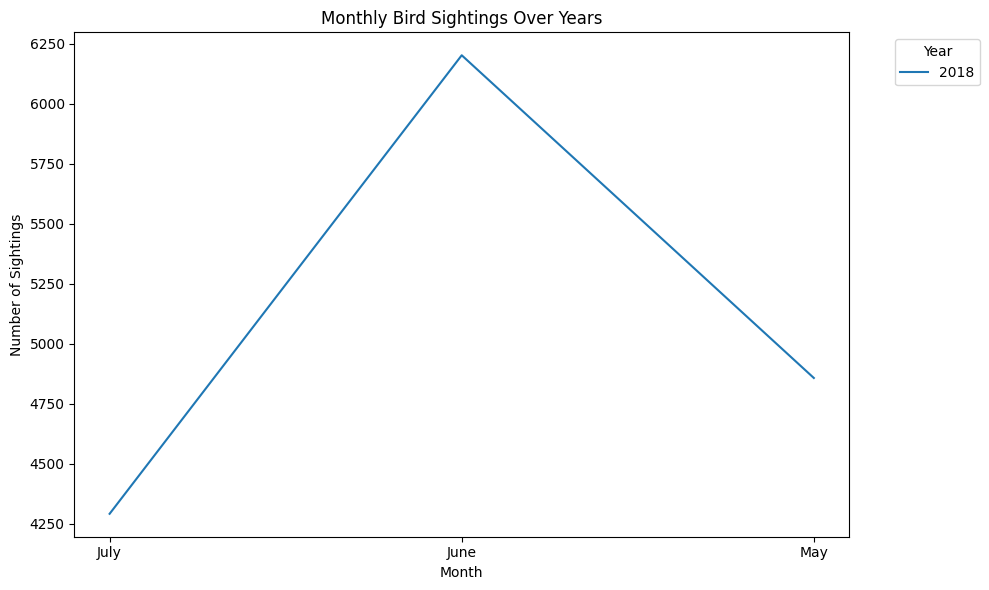

In [99]:
import matplotlib.pyplot as plt
import seaborn as sns
# Monthly Bird Sightings Over Years
plt.figure(figsize=(10, 6))
sns.lineplot(data=monthly_yearly_counts.T)  
plt.title('Monthly Bird Sightings Over Years')
plt.xlabel('Month')
plt.ylabel('Number of Sightings')
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [100]:
# pd.set_option('display.max_row', None)

## Observation Time: Study the Start_Time and End_Time to determine if specific time windows correlate with higher bird activity.

In [101]:
# Convert to fractional hours
cleaned_df.loc[:,'Start_Hour'] = (cleaned_df['Start_Time'].dt.hour + cleaned_df['Start_Time'].dt.minute / 60).round(2)
cleaned_df.loc[:,'End_Hour'] = (cleaned_df['End_Time'].dt.hour + cleaned_df['End_Time'].dt.minute / 60).round(2)

# # Average time of observation
cleaned_df.loc[:,'Mid_Hour'] = ((cleaned_df['Start_Hour'] + cleaned_df['End_Hour']) / 2).round(2)

C:\Users\BHAVATHARANI\AppData\Local\Temp\ipykernel_12580\1509101163.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_df.loc[:,'Start_Hour'] = (cleaned_df['Start_Time'].dt.hour + cleaned_df['Start_Time'].dt.minute / 60).round(2)
C:\Users\BHAVATHARANI\AppData\Local\Temp\ipykernel_12580\1509101163.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_df.loc[:,'End_Hour'] = (cleaned_df['End_Time'].dt.hour + cleaned_df['End_Time'].dt.minute / 60).round(2)
C:\Users\BHAVATHARANI\AppData\Local\Temp

In [102]:
# Create time bins
bins = range(4, 13)
labels = [f"{i}:00–{i+1}:00" for i in bins[:-1]]
cleaned_df.loc[:,'Hour_Bin'] = pd.cut(cleaned_df['Mid_Hour'], bins = bins, labels = labels , right=False)  # 4 AM to 1 PM
time_bin_counts = cleaned_df.groupby('Hour_Bin', observed=True)['Common_Name'].count()
time_bin_counts

C:\Users\BHAVATHARANI\AppData\Local\Temp\ipykernel_12580\570292081.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_df.loc[:,'Hour_Bin'] = pd.cut(cleaned_df['Mid_Hour'], bins = bins, labels = labels , right=False)  # 4 AM to 1 PM


Hour_Bin
5:00–6:00       914
6:00–7:00      3912
7:00–8:00      4039
8:00–9:00      3169
9:00–10:00     2195
10:00–11:00    1121
Name: Common_Name, dtype: int64

In [103]:
cleaned_df['Hour_Bin'] = cleaned_df['Hour_Bin'].astype(str)

C:\Users\BHAVATHARANI\AppData\Local\Temp\ipykernel_12580\2228807723.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_df['Hour_Bin'] = cleaned_df['Hour_Bin'].astype(str)


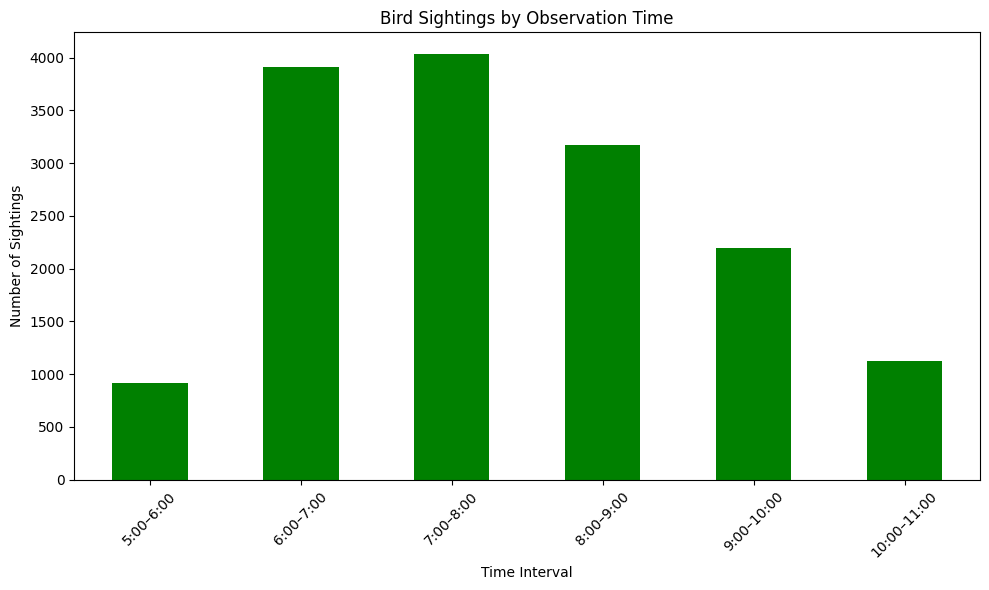

In [104]:
import seaborn as sns
import matplotlib.pyplot as plt
# Bird Sightings by Observation Time
plt.figure(figsize=(10, 6))
time_bin_counts.plot(kind='bar', color='green')
plt.title('Bird Sightings by Observation Time')
plt.xlabel('Time Interval')
plt.ylabel('Number of Sightings')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Spatial Analysis
## Location Insights: Group data by Location_Type (e.g., Grassland) to identify biodiversity hotspots.

In [105]:
biodiversity_by_location = cleaned_df.groupby('Location_Type')['Common_Name'].nunique().sort_values()
print(biodiversity_by_location)

Location_Type
Grassland    107
Forest       108
Name: Common_Name, dtype: int64


In [106]:
obs_counts = cleaned_df.groupby('Location_Type')['Common_Name'].count()
obs_counts

Location_Type
Forest       8533
Grassland    6817
Name: Common_Name, dtype: int64

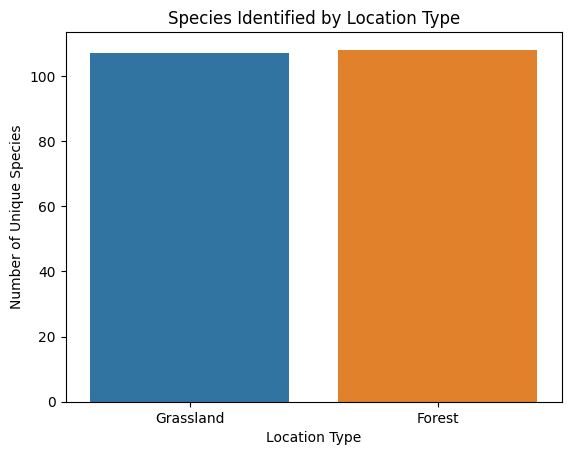

In [107]:
# Species Identified by Location Type
df_bio = biodiversity_by_location.reset_index()
df_bio.columns = ['Location_Type', 'Species_Count']
sns.barplot(data=df_bio, x='Location_Type', y='Species_Count', hue='Location_Type')
plt.title('Species Identified by Location Type')
plt.ylabel('Number of Unique Species')
plt.xlabel('Location Type')
plt.show()

## Plot-Level Analysis: Compare observations across different Plot_Name to see which plots attract more species or specific kinds of birds.

In [108]:
species_find = cleaned_df.groupby('Plot_Name')['Common_Name'].nunique().sort_values(ascending=False)
print(species_find)

Plot_Name
ANTI-0105    27
MONO-0057    27
MANA-0047    27
CHOH-0812    26
MONO-0076    26
             ..
PRWI-0751     6
PRWI-0055     6
PRWI-0446     6
CATO-0365     4
CATO-0158     4
Name: Common_Name, Length: 609, dtype: int64


In [109]:
obs_counts_plot = cleaned_df.groupby('Plot_Name')['Common_Name'].count().sort_values(ascending=False)
obs_counts_plot

Plot_Name
ANTI-0163    54
HAFE-0067    52
ANTI-0028    51
MANA-0048    50
ANTI-0016    49
             ..
PRWI-0689    10
ROCR-0186     9
PRWI-0751     8
CATO-0158     6
CATO-0365     5
Name: Common_Name, Length: 609, dtype: int64

In [110]:
species_by_plot_type = cleaned_df.groupby(['Plot_Name', 'Sex']).size().unstack(fill_value=0)
species_by_plot_type

Sex,Female,Male,Undetermined
Plot_Name,,,
ANTI-0007,0,21,21
ANTI-0008,1,24,15
ANTI-0009,0,20,21
ANTI-0015,1,15,25
ANTI-0016,1,24,24
...,...,...,...
WOTR-0003,0,0,21
WOTR-0004,0,0,28
WOTR-0007,0,0,17


In [111]:
cleaned_df['Plot_Name'].nunique()

609

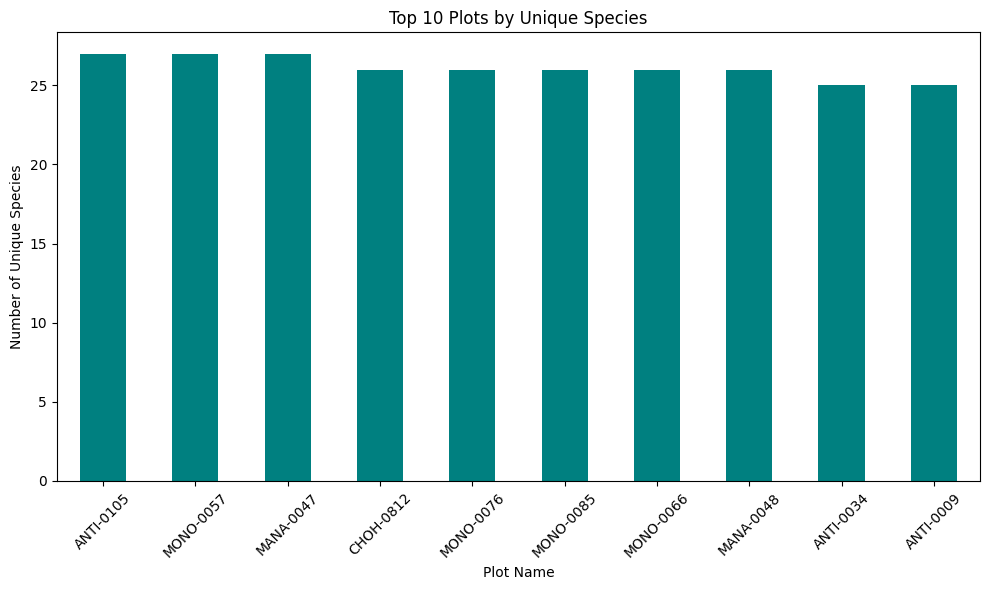

In [112]:
# Top 10 Plots by Unique Species
top_species_plots = species_find.head(10)
top_species_plots.plot(kind='bar', figsize=(10,6), color='teal')
plt.title('Top 10 Plots by Unique Species')
plt.xlabel('Plot Name')
plt.ylabel('Number of Unique Species')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#  Species Analysis
## Diversity Metrics: Count unique species (Scientific_Name) observed and their distribution across Location_Type.

In [113]:
location_species = cleaned_df.groupby('Location_Type')['Scientific_Name'].unique()

# Convert to sets
loc1_species = set(location_species.iloc[0])
loc2_species = set(location_species.iloc[1])

In [114]:
shared_species = loc1_species & loc2_species       # in both
unique_loc1 = loc1_species - loc2_species          # only in loc1
unique_loc2 = loc2_species - loc1_species          # only in loc2
# Count them
print(f"Shared species: {len(shared_species)}")
print(f"Unique to {location_species.index[0]}: {len(unique_loc1)}")
print(f"Unique to {location_species.index[1]}: {len(unique_loc2)}")

Shared species: 88
Unique to Forest: 20
Unique to Grassland: 19


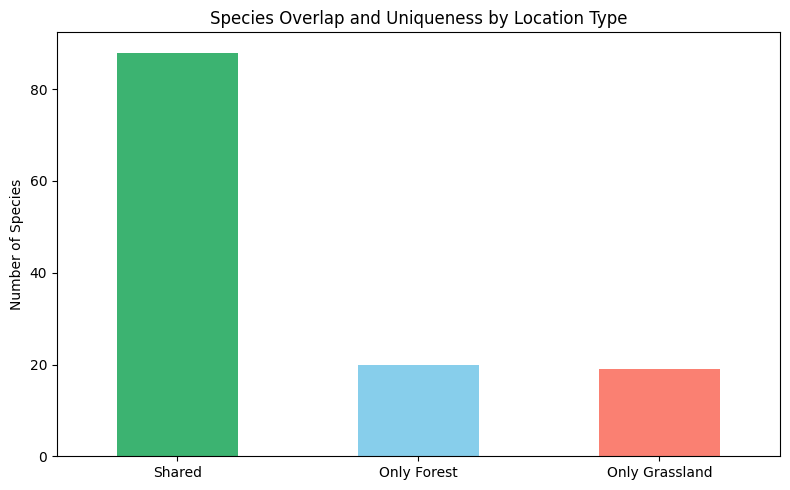

In [115]:
# Species Overlap and Uniqueness by Location Type
import pandas as pd
import matplotlib.pyplot as plt
data = {
    'Shared': len(loc1_species & loc2_species),
    f'Only {location_species.index[0]}': len(loc1_species - loc2_species),
    f'Only {location_species.index[1]}': len(loc2_species - loc1_species)
}
df_overlap = pd.Series(data)
df_overlap.plot(kind='bar', color=['mediumseagreen', 'skyblue', 'salmon'], figsize=(8, 5))
plt.title('Species Overlap and Uniqueness by Location Type')
plt.ylabel('Number of Species')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

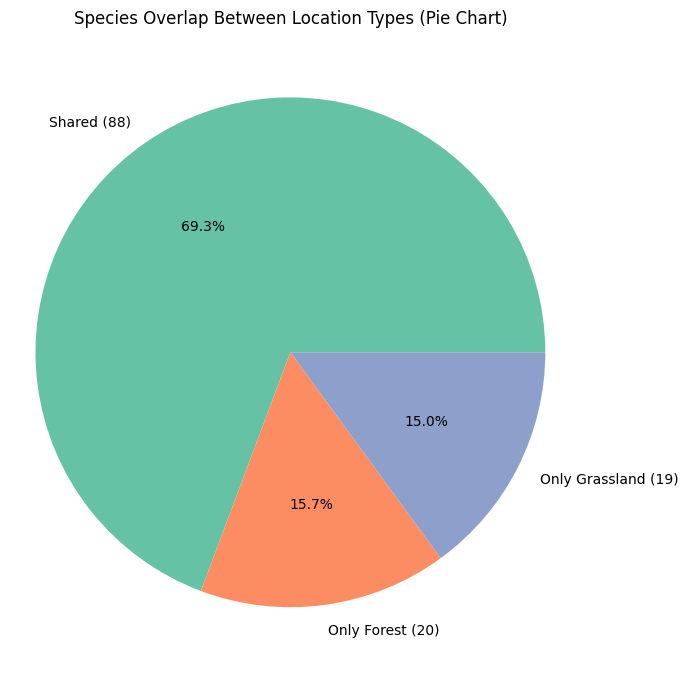

In [116]:
# Species Overlap Between Location Types 

# Counts
shared = len(loc1_species & loc2_species)
only_loc1 = len(loc1_species - loc2_species)
only_loc2 = len(loc2_species - loc1_species)
labels = [
    f'Shared ({shared})',
    f'Only {location_species.index[0]} ({only_loc1})',
    f'Only {location_species.index[1]} ({only_loc2})'
]
sizes = [shared, only_loc1, only_loc2]
colors = ['#66c2a5', '#fc8d62', '#8da0cb']
plt.figure(figsize=(7, 7))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%')
plt.title('Species Overlap Between Location Types (Pie Chart)')
plt.axis('equal')  # Equal aspect ratio ensures the pie is circular
plt.tight_layout()
plt.show()

## Activity Patterns: Check the Interval_Length and ID_Method columns to identify the most common activity types (e.g., Singing).

In [117]:
cleaned_df.loc[:,'Interval_Duration'] = cleaned_df['Interval_End'] - cleaned_df['Interval_Start']

C:\Users\BHAVATHARANI\AppData\Local\Temp\ipykernel_12580\1132383633.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_df.loc[:,'Interval_Duration'] = cleaned_df['Interval_End'] - cleaned_df['Interval_Start']


In [118]:
print(cleaned_df['ID_Method'].unique())
print(cleaned_df['Interval_Duration'].unique())

['Singing' 'Calling' 'Visualization']
[2.5]


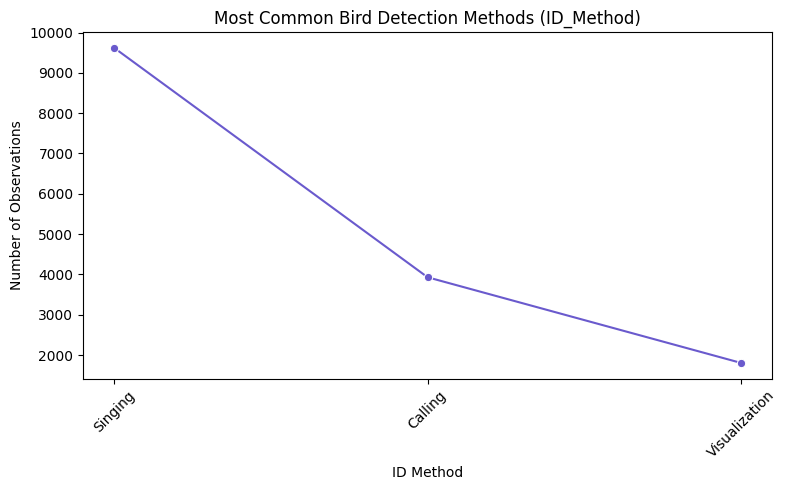

In [119]:
# Most Common Bird Detection Methods
id_method_counts = cleaned_df['ID_Method'].value_counts().reset_index()
id_method_counts.columns = ['ID_Method', 'Count']
plt.figure(figsize=(8, 5))
sns.lineplot(data=id_method_counts, x='ID_Method', y='Count', marker='o', color='slateblue')
plt.title('Most Common Bird Detection Methods (ID_Method)')
plt.xlabel('ID Method')
plt.ylabel('Number of Observations')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

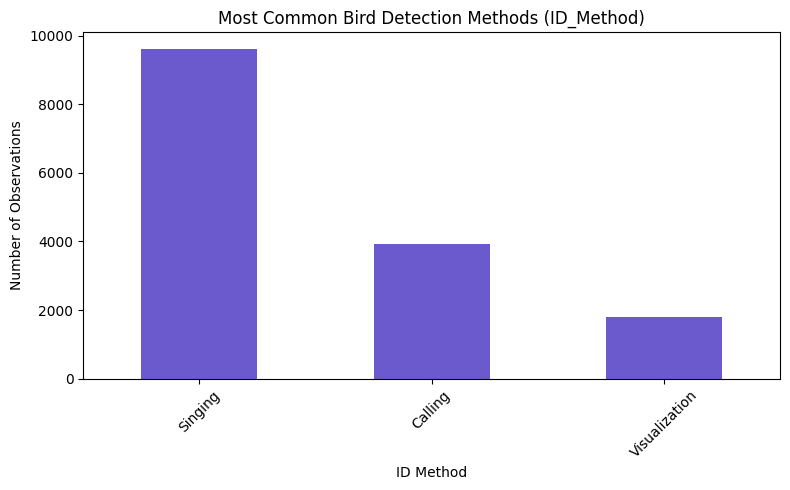

In [120]:
# Most Common Bird Detection Method
id_method_counts = cleaned_df['ID_Method'].value_counts()
id_method_counts.plot(kind='bar', color='slateblue', figsize=(8, 5))
plt.title('Most Common Bird Detection Methods (ID_Method)')
plt.xlabel('ID Method')
plt.ylabel('Number of Observations')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

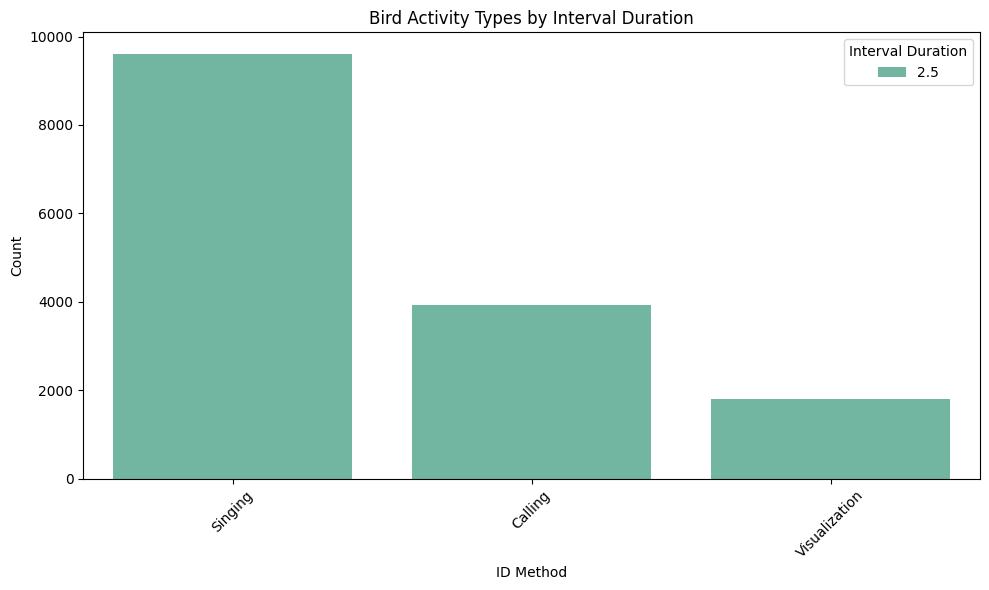

In [121]:
# Bird Activity Types by Interval Duration
plt.figure(figsize=(10, 6))
sns.countplot(data=cleaned_df, x='ID_Method', hue='Interval_Duration', palette='Set2')
plt.title('Bird Activity Types by Interval Duration')
plt.xlabel('ID Method')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Interval Duration')
plt.tight_layout()
plt.show()

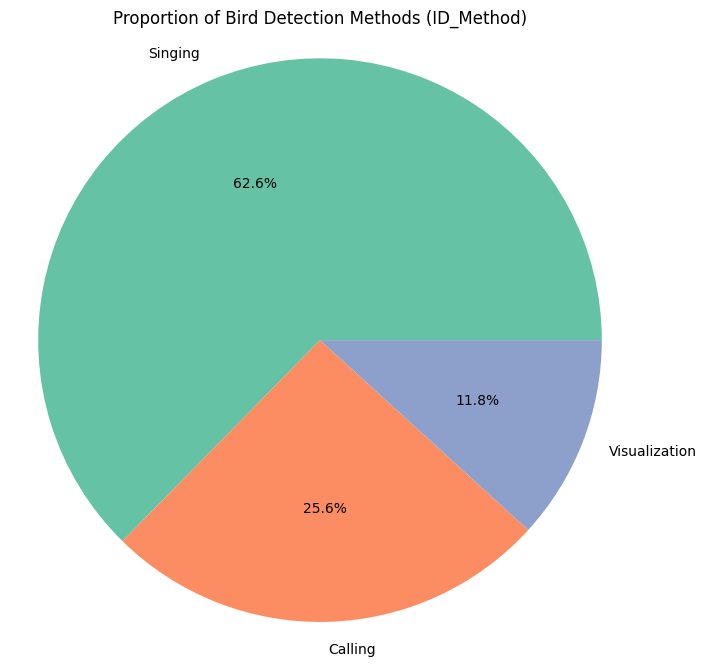

In [122]:
# Proportion of Bird Detection Methods
id_method_counts = cleaned_df['ID_Method'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(id_method_counts, labels=id_method_counts.index, autopct='%1.1f%%', colors=colors)
plt.title('Proportion of Bird Detection Methods (ID_Method)')
plt.axis('equal')  # Equal aspect ratio ensures the pie is circular
plt.show()

## Sex Ratio: Analyze the Sex column to understand the male-to-female ratio for different species.

In [123]:
print(cleaned_df['Sex'].unique())

['Male' 'Undetermined' 'Female']


In [124]:
sex_counts = cleaned_df.groupby(['Scientific_Name', 'Sex']).size().unstack(fill_value=0)
print(sex_counts.head())

Sex                    Female  Male  Undetermined
Scientific_Name                                  
Accipiter cooperii          0     0             2
Agelaius phoeniceus        18   180           124
Aix sponsa                  0     2             2
Ammodramus savannarum       0   323            28
Anas platyrhynchos          0     1             2


In [125]:
sex_counts['Male_to_Female_Ratio'] = sex_counts['Male'] / sex_counts['Female'].replace(0, float('nan'))
sex_counts

Sex,Female,Male,Undetermined,Male_to_Female_Ratio
Scientific_Name,,,,
Accipiter cooperii,0,0,2,NaN
Agelaius phoeniceus,18,180,124,10.0
Aix sponsa,0,2,2,NaN
Ammodramus savannarum,0,323,28,NaN
Anas platyrhynchos,0,1,2,NaN
...,...,...,...,...
Vireo gilvus,0,32,26,NaN
Vireo griseus,0,0,13,NaN
Vireo olivaceus,0,44,692,NaN


In [126]:
print(sex_counts.sort_values('Male_to_Female_Ratio', ascending=False).head(10))

Sex                   Female  Male  Undetermined  Male_to_Female_Ratio
Scientific_Name                                                       
Geothlypis trichas         1    99            39             99.000000
Passerina cyanea           6   450           155             75.000000
Turdus migratorius         2    81           386             40.500000
Sturnella magna            5   148            23             29.600000
Guiraca caerulea           1    14             0             14.000000
Agelaius phoeniceus       18   180           124             10.000000
Icterus spurius            1    10             6             10.000000
Molothrus ater            18    93           217              5.166667
Hirundo rustica            1     5           126              5.000000
Haemorhous mexicanus       2    10            16              5.000000


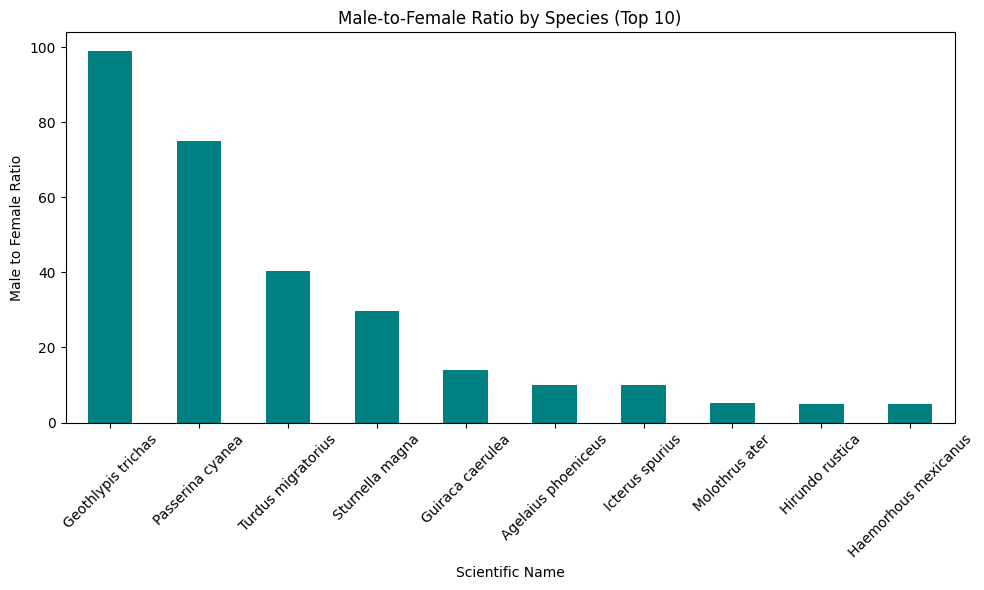

In [127]:
# Male to Female Ratio
top_species = sex_counts.sort_values('Male_to_Female_Ratio', ascending=False).head(10)
top_species['Male_to_Female_Ratio'].plot(kind='bar', color='teal', figsize=(10,6))
plt.title('Male-to-Female Ratio by Species (Top 10)')
plt.ylabel('Male to Female Ratio')
plt.xlabel('Scientific Name')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

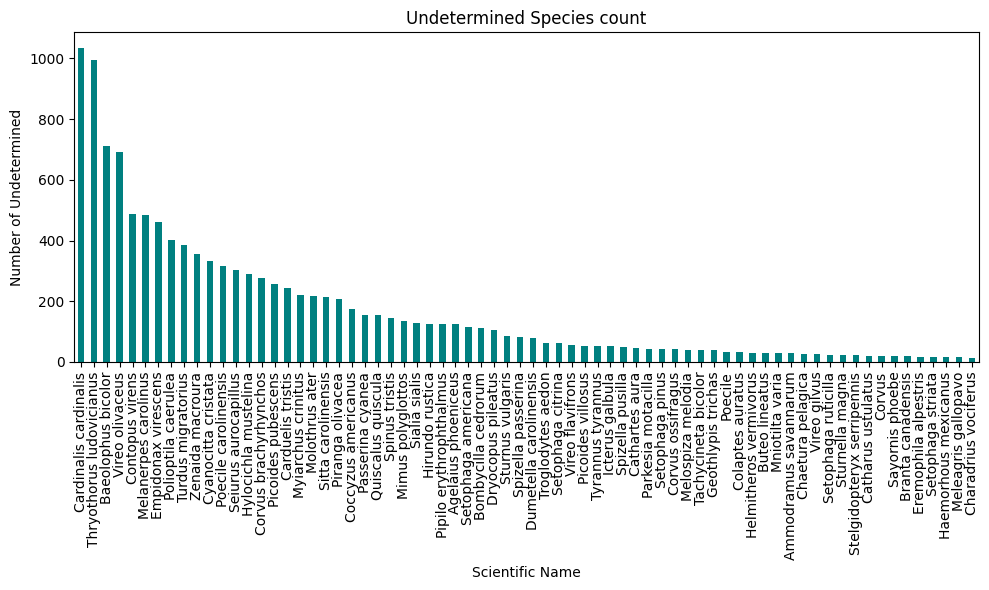

In [128]:
# Undetermined Species count
Undetermined_species = sex_counts.sort_values('Undetermined', ascending=False).head(70)
Undetermined_species['Undetermined'].plot(kind='bar', color='teal', figsize=(10,6))
plt.title('Undetermined Species count')
plt.ylabel('Number of Undetermined')
plt.xlabel('Scientific Name')
plt.tight_layout()
plt.show()

In [129]:
sex_counts = cleaned_df.groupby(['Scientific_Name', 'Sex']).size().unstack(fill_value=0)

# Species with least males 
least_males = sex_counts[sex_counts['Male'] > 0].sort_values('Male')

# Species with least females 
least_females = sex_counts[sex_counts['Female'] > 0].sort_values('Female')

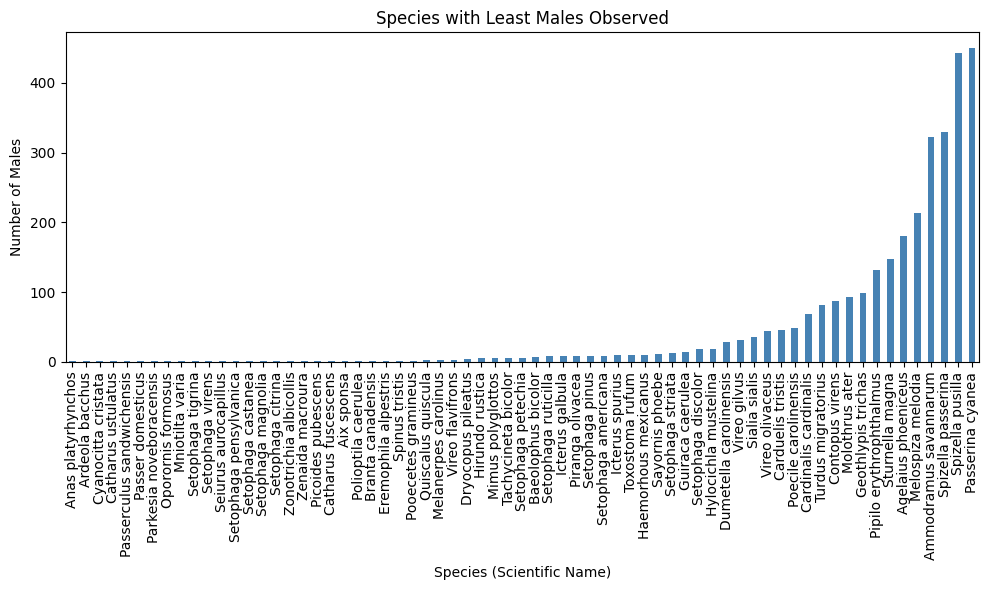

In [130]:
# Species with Least Males Observed
plt.figure(figsize=(10, 6))
least_males['Male'].plot(kind='bar', color='steelblue')
plt.title('Species with Least Males Observed')
plt.xlabel('Species (Scientific Name)')
plt.ylabel('Number of Males')
plt.tight_layout()
plt.show()

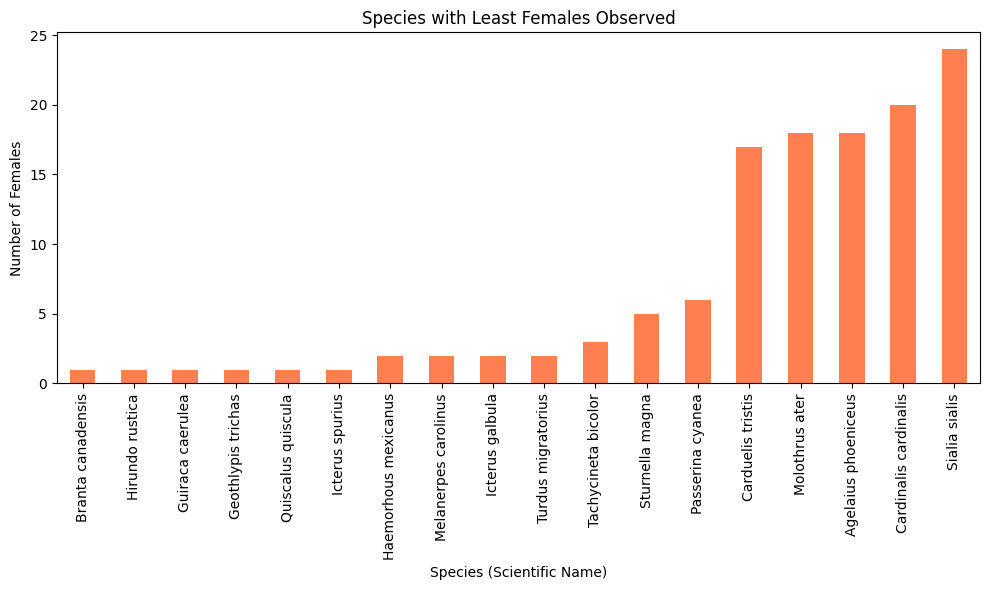

In [131]:
# Species with Least Females Observed
plt.figure(figsize=(10, 6))
least_females['Female'].plot(kind='bar', color='coral')
plt.title('Species with Least Females Observed')
plt.xlabel('Species (Scientific Name)')
plt.ylabel('Number of Females')
plt.tight_layout()
plt.show()

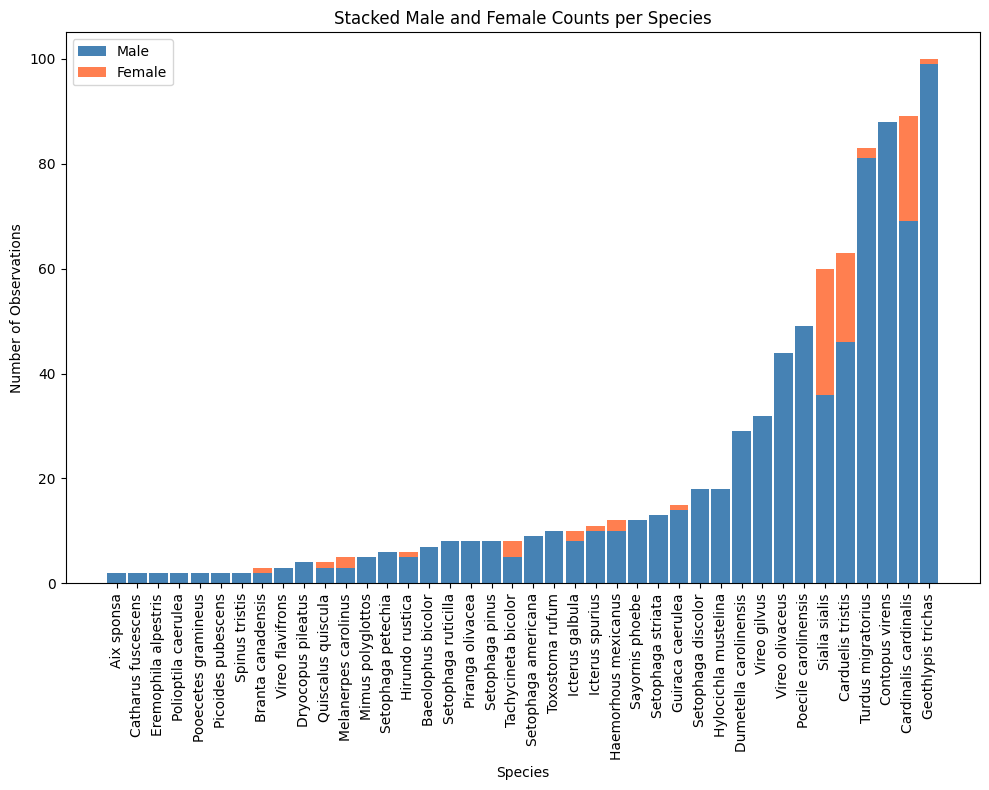

In [132]:
# Stacked Male and Female Counts per Species
sex_counts = cleaned_df.groupby(['Scientific_Name', 'Sex']).size().unstack(fill_value=0)

# Calculate total counts (male + female)
sex_counts['Total'] = sex_counts.get('Male', 0) + sex_counts.get('Female', 0)

# Select species with lowest total
lowest_total = sex_counts[sex_counts['Total'] > 1].sort_values('Total').head(40)

# Species names
species = lowest_total.index.tolist()

# Male and female counts
male_counts = lowest_total['Male'].values
female_counts = lowest_total['Female'].values
plt.figure(figsize=(10,8))
plt.bar(species, male_counts, label='Male', color='steelblue', width=0.9)
plt.bar(species, female_counts, bottom=male_counts, label='Female', color='coral', width=0.9)
plt.ylabel('Number of Observations')
plt.xlabel('Species')
plt.title('Stacked Male and Female Counts per Species')
plt.xticks(rotation=90)
plt.tight_layout()
plt.legend()
plt.show()

# Environmental Conditions
## Weather Correlation: Explore how Temperature, Humidity, Sky, and Wind impact observations, such as the number of birds or their distances.


In [133]:
cleaned_df['Common_Name'].nunique()

126

In [134]:
cleaned_df.Common_Name.value_counts().head(30)

Common_Name
Northern Cardinal           1123
Carolina Wren                993
Red-eyed Vireo               736
Eastern Tufted Titmouse      719
Indigo Bunting               611
Eastern Wood-Pewee           574
Field Sparrow                492
Red-bellied Woodpecker       488
American Robin               469
Acadian Flycatcher           461
American Goldfinch           453
Chipping Sparrow             411
Blue-gray Gnatcatcher        404
Carolina Chickadee           364
Mourning Dove                358
Grasshopper Sparrow          351
Blue Jay                     332
Brown-headed Cowbird         328
Red-winged Blackbird         322
Wood Thrush                  309
Ovenbird                     304
American Crow                277
Downy Woodpecker             260
Eastern Towhee               257
Song Sparrow                 254
Great Crested Flycatcher     222
Scarlet Tanager              216
White-breasted Nuthatch      213
Eastern Bluebird             190
Eastern Meadowlark           17

In [135]:
cleaned_df['Temperature'].value_counts()

Temperature
22    1781
21    1542
23    1420
20    1303
19    1262
24    1193
25     965
18     918
26     783
17     719
27     680
16     409
29     404
15     379
28     367
14     318
30     266
31     138
32     105
33     105
34      76
13      68
11      47
12      43
35      37
37      12
36      10
Name: count, dtype: int64

In [136]:
cleaned_df['Sky'].value_counts()

Sky
Partly Cloudy          6165
Clear or Few Clouds    5324
Cloudy/Overcast        2911
Fog                     598
Mist/Drizzle            352
Name: count, dtype: int64

In [137]:
cleaned_df['Wind'].value_counts()

Wind
Light air movement (1-3 mph) smoke drifts     7624
Calm (< 1 mph) smoke rises vertically         4205
Light breeze (4-7 mph) wind felt on face      3157
Gentle breeze (8-12 mph), leaves in motion     364
Name: count, dtype: int64

In [138]:
cleaned_df['Humidity'].value_counts()

Humidity
84    781
77    707
83    630
85    587
82    570
     ... 
98     11
95      9
36      9
7       8
44      6
Name: count, Length: 68, dtype: int64

In [139]:
species_by_sky = cleaned_df.groupby('Sky')['Common_Name'].value_counts().sort_values(ascending=False).head(50).reset_index(name='Count')
# print(species_by_sky)

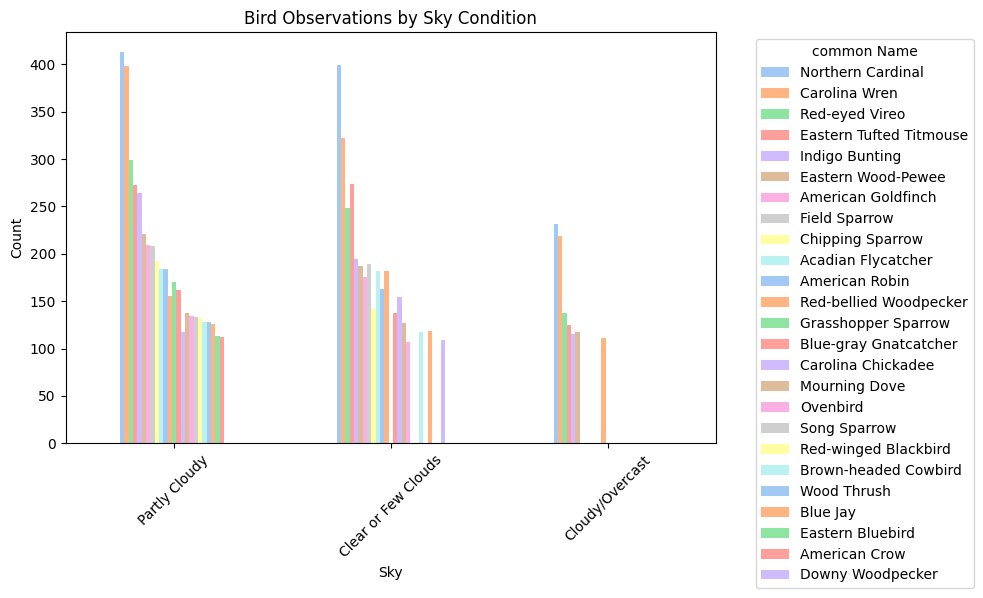

In [140]:
# Bird Observations by Sky Condition
species_by_sky = cleaned_df.groupby('Sky')['Common_Name'].value_counts().sort_values(ascending=False).head(50).unstack()
colours = sns.color_palette("pastel")
species_by_sky.plot(kind='bar', color=colours, figsize=(10,6))
plt.title('Bird Observations by Sky Condition')
plt.ylabel('Count')
plt.xlabel('Sky')
plt.xticks(rotation=45)
plt.legend(title='common Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

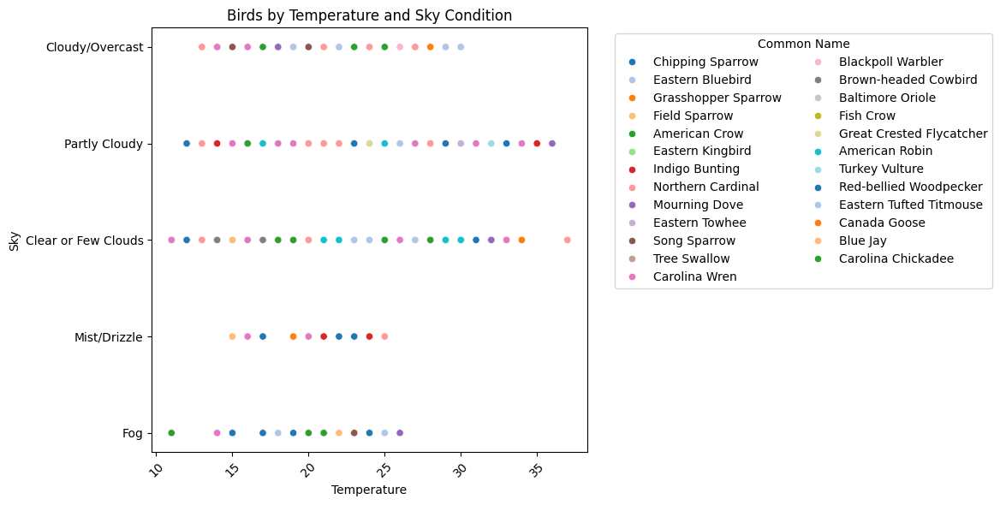

In [141]:
# Birds by Temperature and Sky Condition
top_species = cleaned_df['Common_Name'].head(50).unique()
subset_df = cleaned_df[cleaned_df['Common_Name'].isin(top_species)]
plt.figure(figsize=(12, 6))
sns.scatterplot(data=subset_df,x='Temperature',y='Sky',hue='Common_Name',palette='tab20', legend='full')
plt.title('Birds by Temperature and Sky Condition')
plt.xlabel('Temperature')
plt.ylabel('Sky')
plt.xticks(rotation=45)
plt.legend(title='Common Name', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.tight_layout()
plt.show()

In [142]:
import plotly.express as px
# Birds by Temperature and Sky Condition
subset_df = cleaned_df[cleaned_df['Common_Name'].isin(cleaned_df['Common_Name'].head(50).unique())]
fig = px.scatter(subset_df,x='Temperature',y='Sky',color='Common_Name',title='Birds by Temperature and Sky Condition',
    labels={'Common_Name': 'Species'},width=1000,height=500)
fig.update_layout(legend_title='Common Name',legend=dict(orientation="v",yanchor="top",y=1,xanchor="left",x=1.02),
    margin=dict(r=150))
fig.show()

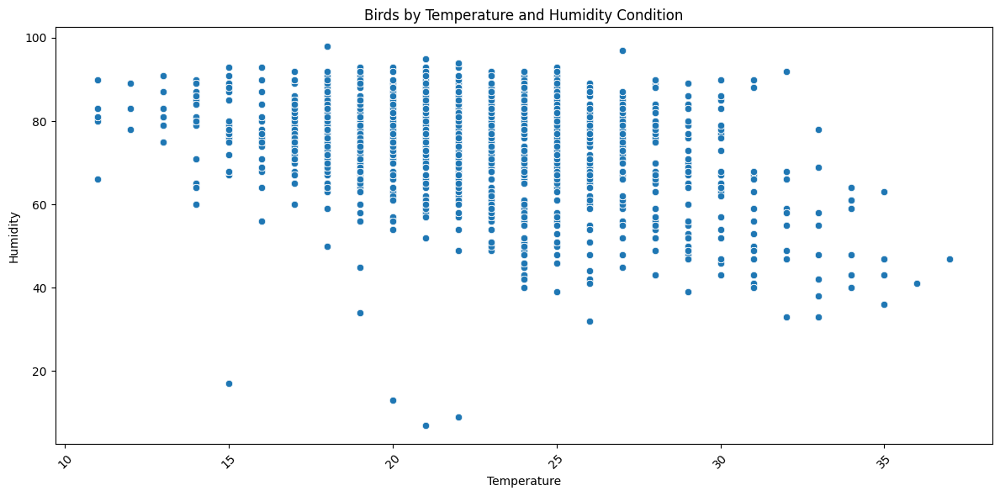

In [143]:
# Birds by Temperature and Humidity Condition
top_species = cleaned_df['Common_Name'].unique()
subset_df = cleaned_df[cleaned_df['Common_Name'].isin(top_species)]
plt.figure(figsize=(12, 6))
sns.scatterplot(data=subset_df,x='Temperature',y='Humidity',legend='full')
plt.title('Birds by Temperature and Humidity Condition')
plt.xlabel('Temperature')
plt.ylabel('Humidity')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [144]:
# Birds by Temperature and Wind Condition
subset_df = cleaned_df[cleaned_df['Common_Name'].isin(cleaned_df['Common_Name'].head(50).unique())]
fig = px.scatter(subset_df,x='Temperature',y='Wind',color='Common_Name',title='Birds by Temperature and Wind Condition',
    labels={'Common_Name': 'Species'},width=1000,height=500)
fig.update_layout(legend_title='Common Name',legend=dict(orientation="v",yanchor="top",y=1,xanchor="left",x=1.02),
    margin=dict(r=150))
fig.show()

## Disturbance Effect: Assess the impact of Disturbance (e.g., slight effect) on bird sightings.

In [145]:
cleaned_df['Disturbance'].value_counts()

Disturbance
No effect on count          7518
Slight effect on count      5829
Moderate effect on count    1573
Serious effect on count      430
Name: count, dtype: int64

In [146]:
cleaned_df['Common_Name'].nunique()

126

In [147]:
top_species = cleaned_df['Common_Name'].value_counts().index
filtered_df = cleaned_df[cleaned_df['Common_Name'].isin(top_species)]
heatmap_df = filtered_df.groupby(['Disturbance', 'Common_Name']).size().unstack(fill_value=0)

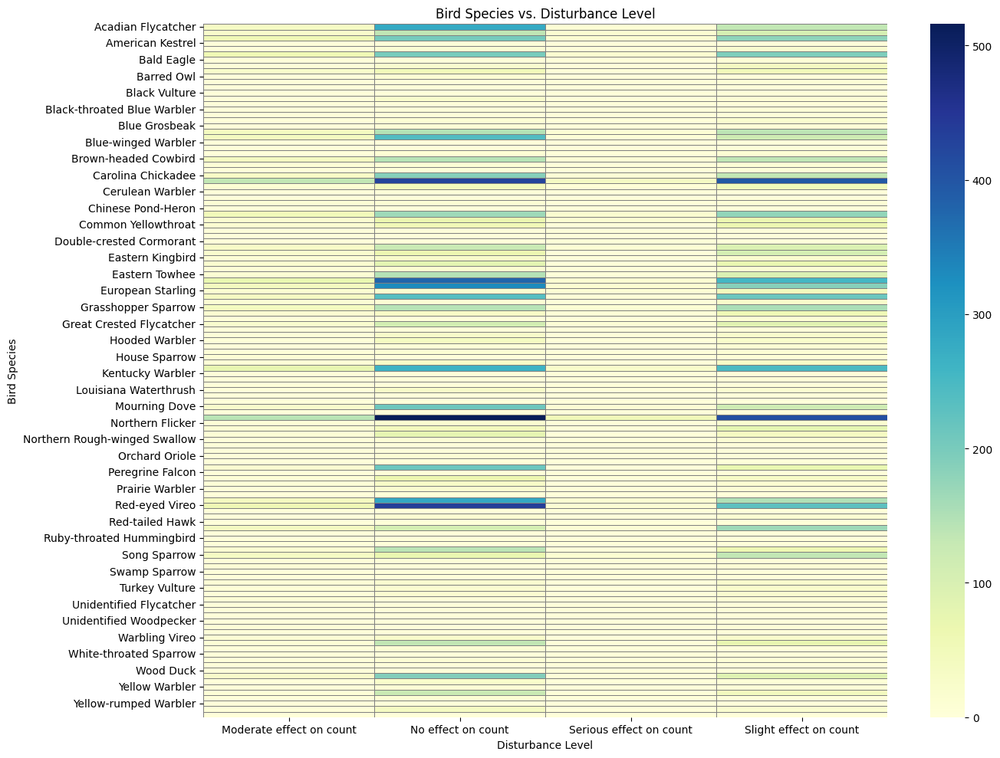

In [148]:
# Bird Species vs. Disturbance Level
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_df.T, cmap='YlGnBu', linewidths=0.5, linecolor='gray')
plt.ylabel('Bird Species')
plt.xlabel('Disturbance Level')
plt.title('Bird Species vs. Disturbance Level')
plt.tight_layout()

# Distance and Behavior
## Distance Analysis: Evaluate the Distance column to identify species typically observed closer or farther from the observer

In [149]:
cleaned_df.loc[:,'Distance_Mid'] = (cleaned_df['Distance_Start'] + cleaned_df['Distance_End']) / 2

C:\Users\BHAVATHARANI\AppData\Local\Temp\ipykernel_12580\1754283174.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [150]:
distance_summary = (cleaned_df.groupby('Common_Name')['Distance_Mid'].mean().sort_values())
# distance_summary

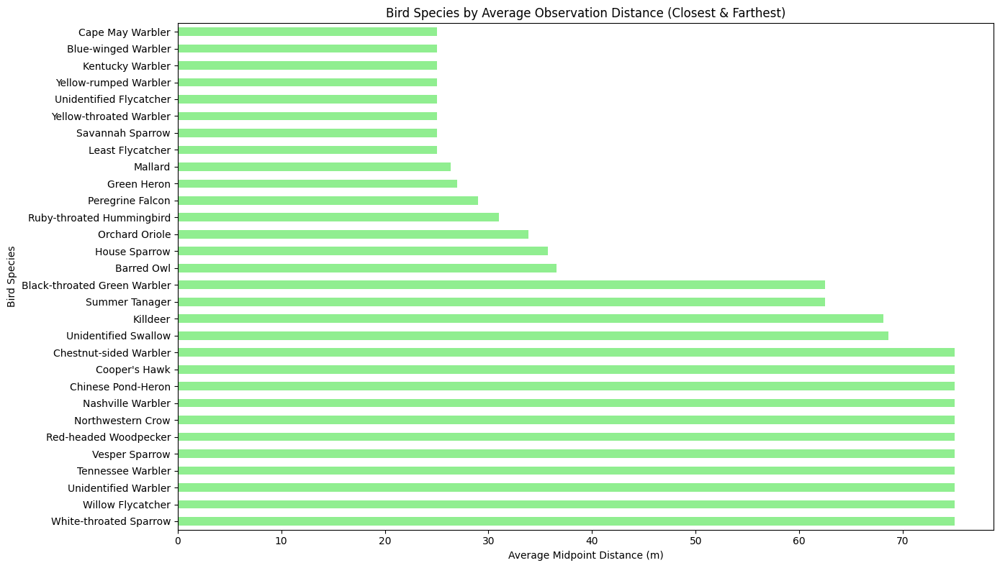

In [151]:
# Get 15 species observed closest and farthest
closest_species = distance_summary.head(15)
farthest_species = distance_summary.tail(15)
combined = pd.concat([closest_species, farthest_species])
plt.figure(figsize=(14, 8))
combined.plot(kind='barh', color='lightgreen')
plt.xlabel('Average Midpoint Distance (m)')
plt.ylabel('Bird Species')
plt.title('Bird Species by Average Observation Distance (Closest & Farthest)')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


## Flyover Frequency: Examine the Flyover_Observed column to detect trends in bird behavior during observation.

In [152]:
cleaned_df['Flyover_Observed'].value_counts()

Flyover_Observed
False    14670
True       680
Name: count, dtype: int64

In [153]:
flyover_summary = (cleaned_df.groupby('Common_Name')['Flyover_Observed'].mean().sort_values(ascending=False))
# flyover_summary
flyover_summary_percent = (flyover_summary * 100).head(46)

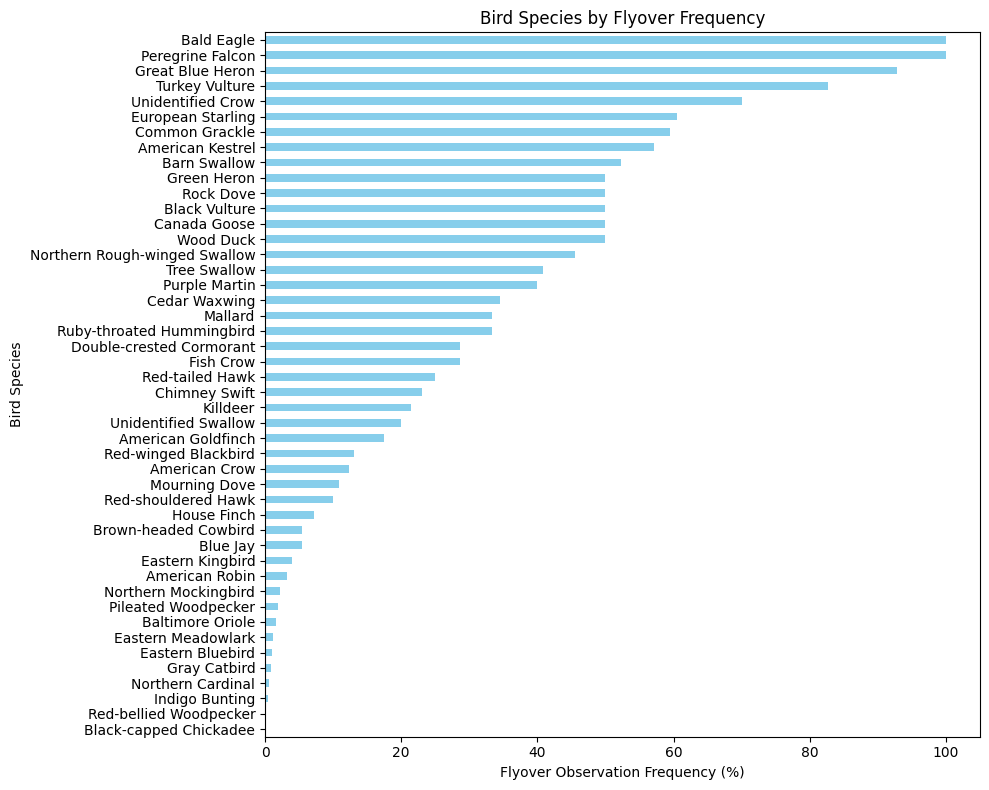

In [154]:
# Bird Species by Flyover Frequency
plt.figure(figsize=(10, 8))
flyover_summary_percent.plot(kind='barh', color='skyblue')
plt.xlabel('Flyover Observation Frequency (%)')
plt.ylabel('Bird Species')
plt.title('Bird Species by Flyover Frequency')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


# Observer Trends
## Observer Bias: Analyze data by Observer to check if specific individuals report more observations or certain species

In [155]:
# Total Observations per Observer
obs_counts = cleaned_df['Observer'].value_counts()
obs_counts

Observer
Elizabeth Oswald    5756
Kimberly Serno      5332
Brian Swimelar      4262
Name: count, dtype: int64

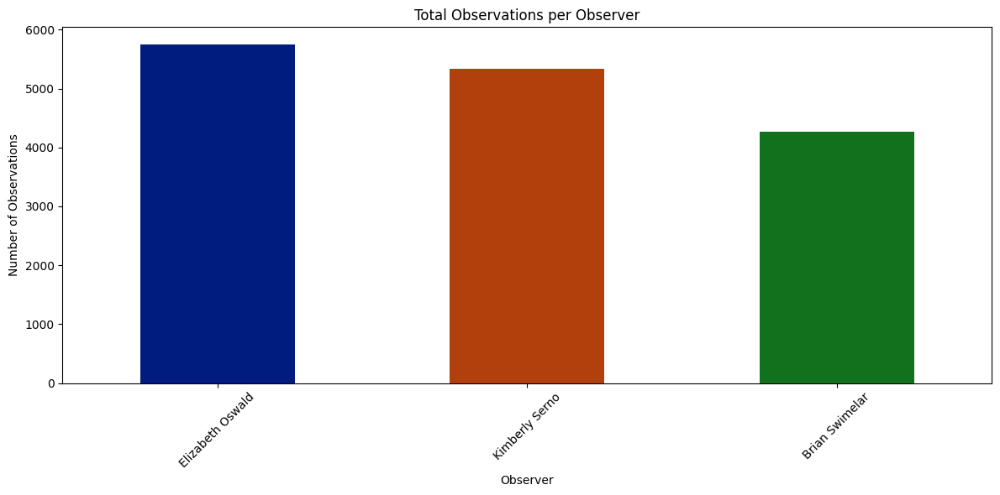

In [156]:
# Total Observations per Observer
colours = sns.color_palette("dark")
obs_counts.plot(kind='bar', figsize=(12, 6), color=colours)
plt.ylabel('Number of Observations')
plt.title('Total Observations per Observer')
plt.xticks(rotation=45, ha='center')
plt.tight_layout()
plt.show()

In [157]:
# Unique Species per Observer
species_per_observer = (cleaned_df.groupby('Observer')['Common_Name'].nunique().sort_values(ascending=False))
species_per_observer

Observer
Elizabeth Oswald    119
Kimberly Serno       90
Brian Swimelar       83
Name: Common_Name, dtype: int64

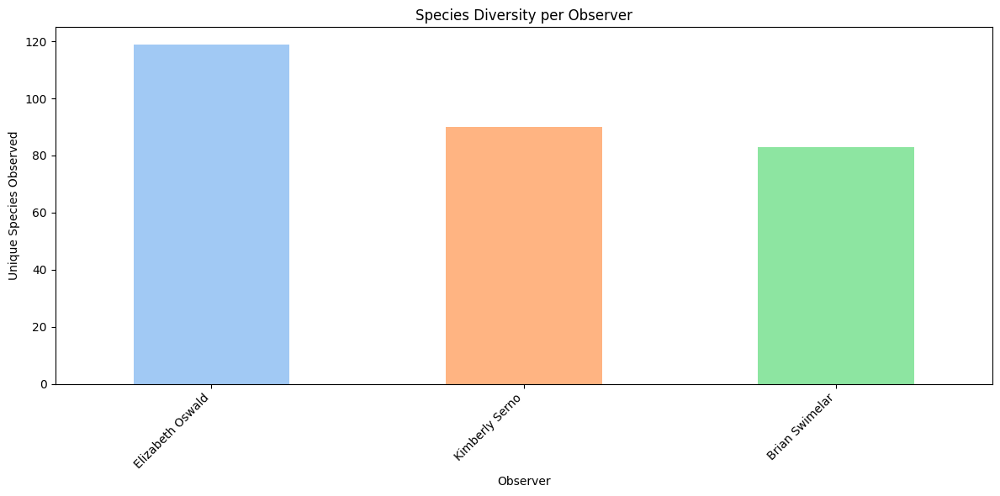

In [158]:
# Species Diversity per Observer
colours = sns.color_palette("pastel")
species_per_observer.plot(kind='bar', figsize=(12, 6), color=colours)
plt.ylabel('Unique Species Observed')
plt.title('Species Diversity per Observer')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

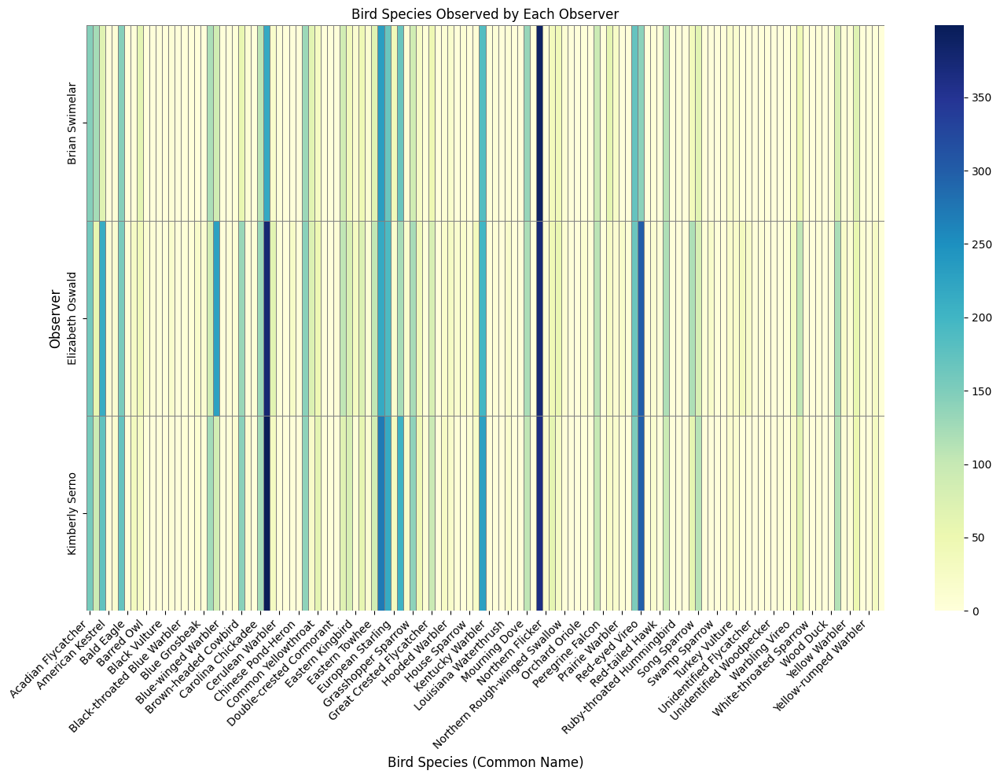

In [159]:
# Bird Species Observed by Each Observer
heatmap_df = cleaned_df.groupby(['Observer', 'Common_Name']).size().unstack(fill_value=0)
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_df, cmap='YlGnBu', linewidths=0.5, linecolor='gray')
plt.title('Bird Species Observed by Each Observer')
plt.xlabel('Bird Species (Common Name)', fontsize=12)
plt.ylabel('Observer', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [160]:
#  Most Frequently Reported Species per Observer
top_species_by_observer = (cleaned_df.groupby(['Observer', 'Common_Name']).size().groupby(level=0).nlargest(1)
.reset_index(level=0, drop=True))
top_species_by_observer

Observer          Common_Name      
Brian Swimelar    Northern Cardinal    387
Elizabeth Oswald  Carolina Wren        376
Kimberly Serno    Carolina Wren        399
dtype: int64

## Visit Patterns: Evaluate the Visit column to see how repeated visits affect species count or diversity.

In [161]:
species_richness = cleaned_df.groupby('Visit')['Common_Name'].nunique()
species_richness


Visit
1    118
2     99
3     74
Name: Common_Name, dtype: int64

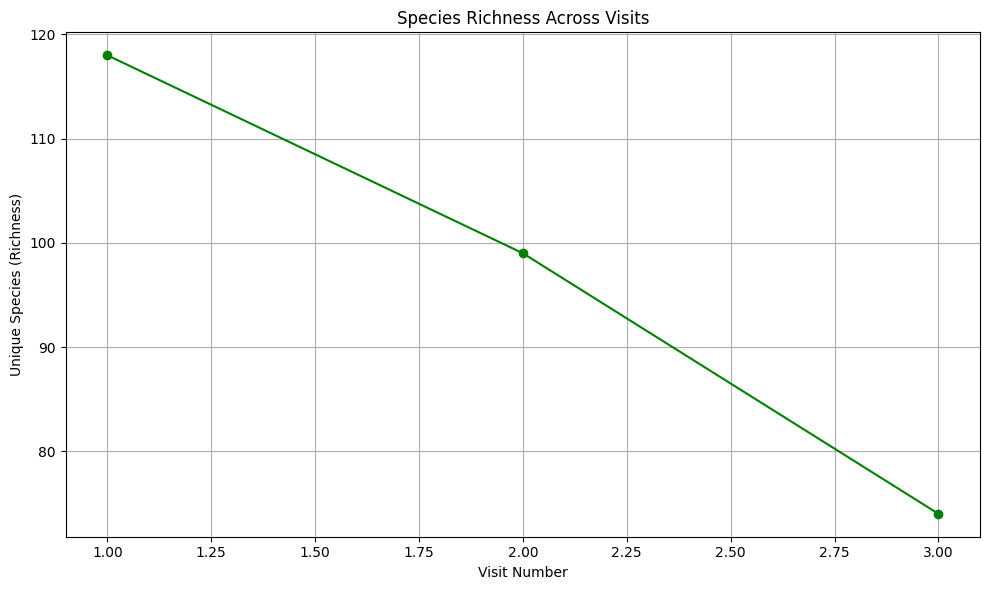

In [162]:
# Species Richness Across Visits
species_richness.plot(kind='line', marker='o', figsize=(10, 6), color='green')
plt.ylabel('Unique Species (Richness)')
plt.xlabel('Visit Number')
plt.title('Species Richness Across Visits')
plt.grid(True)
plt.tight_layout()
plt.show()

In [163]:
visit_totals = cleaned_df['Visit'].value_counts().sort_index()
visit_totals

Visit
1    6846
2    6400
3    2104
Name: count, dtype: int64

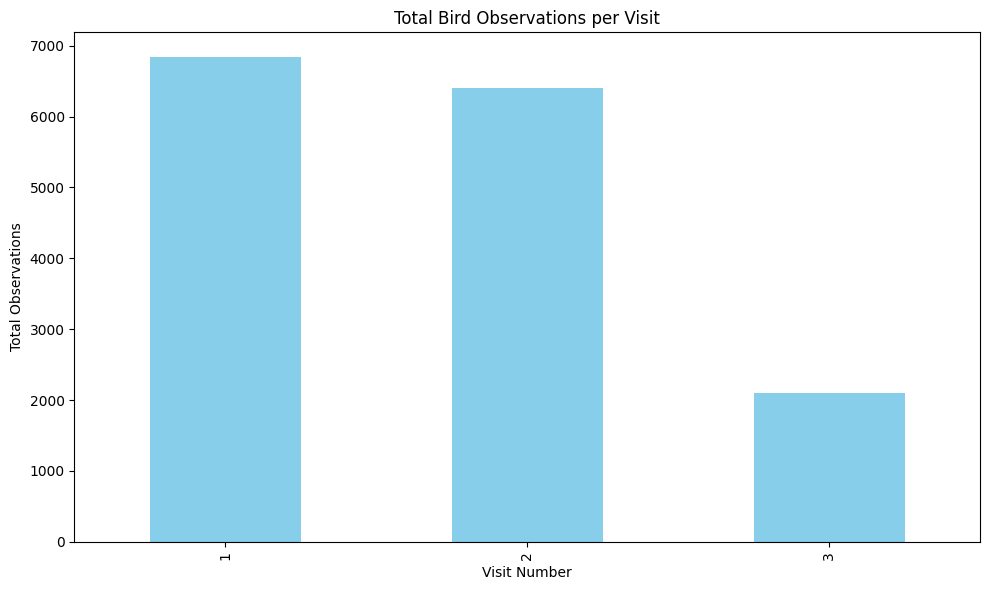

In [164]:
# Total Bird Observations per Visit
visit_totals.plot(kind='bar', color='skyblue', figsize=(10, 6))
plt.ylabel('Total Observations')
plt.xlabel('Visit Number')
plt.title('Total Bird Observations per Visit')
plt.tight_layout()
plt.show()

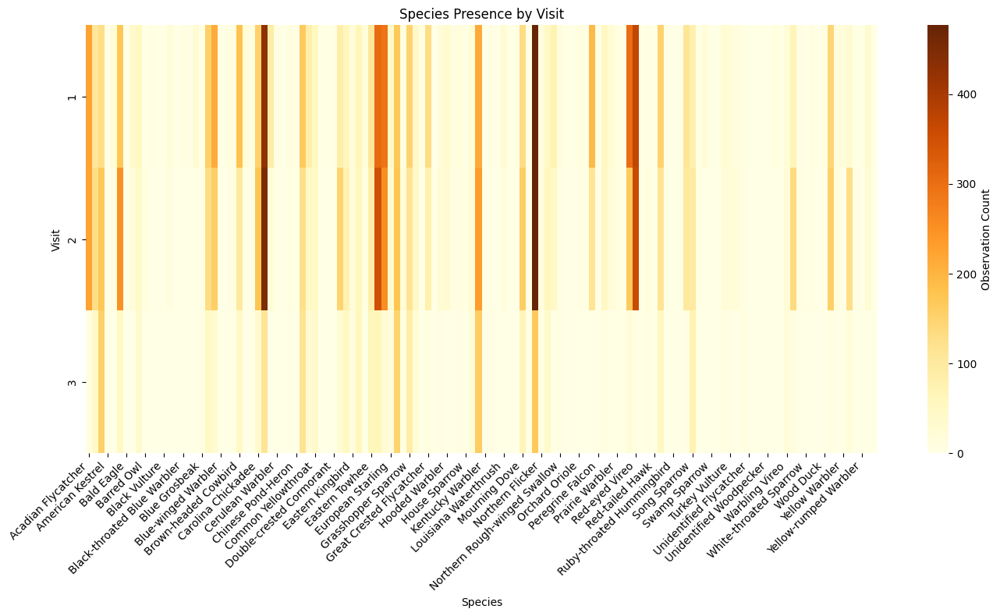

In [165]:
# Species Presence by Visit
visit_species = cleaned_df.groupby(['Visit', 'Common_Name']).size().unstack(fill_value=0)
plt.figure(figsize=(14, 8))
sns.heatmap(visit_species, cmap='YlOrBr', cbar_kws={'label': 'Observation Count'})
plt.title('Species Presence by Visit')
plt.xlabel('Species')
plt.ylabel('Visit')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [166]:
# Species Richness per Visit per Location
richness_by_location = (cleaned_df.groupby(['Admin_Unit_Code', 'Visit'])['Common_Name'].nunique().reset_index(name='Species_Richness'))
richness_by_location

,Admin_Unit_Code,Visit,Species_Richness
0,ANTI,1,70
1,ANTI,2,68
2,ANTI,3,56
3,CATO,1,42
4,CATO,2,37
5,CHOH,1,69
6,CHOH,2,63
7,GWMP,1,39
8,GWMP,2,41
9,HAFE,1,46


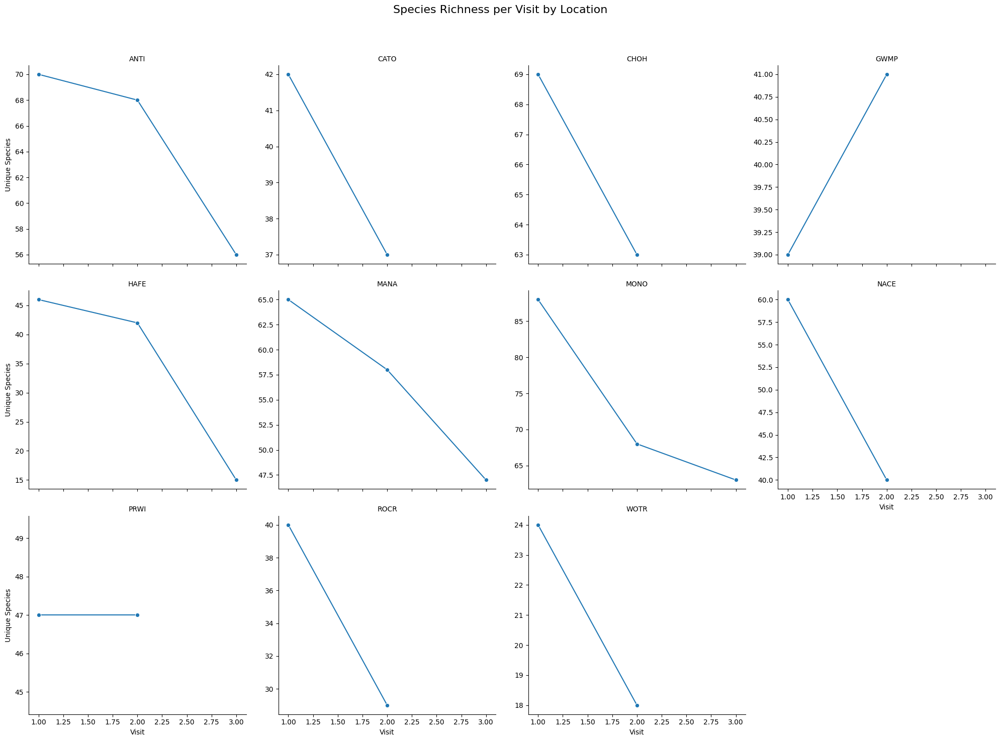

In [167]:
# Species Richness per Visit by Location
g = sns.relplot(data=richness_by_location,x='Visit',y='Species_Richness',col='Admin_Unit_Code',kind='line',
    col_wrap=4,  marker='o',facet_kws={'sharey': False, 'sharex': True})
g.set_titles('{col_name}')
g.set_axis_labels("Visit", "Unique Species")
g.figure.subplots_adjust(top=0.9)
g.figure.suptitle('Species Richness per Visit by Location', fontsize=16)
plt.show()

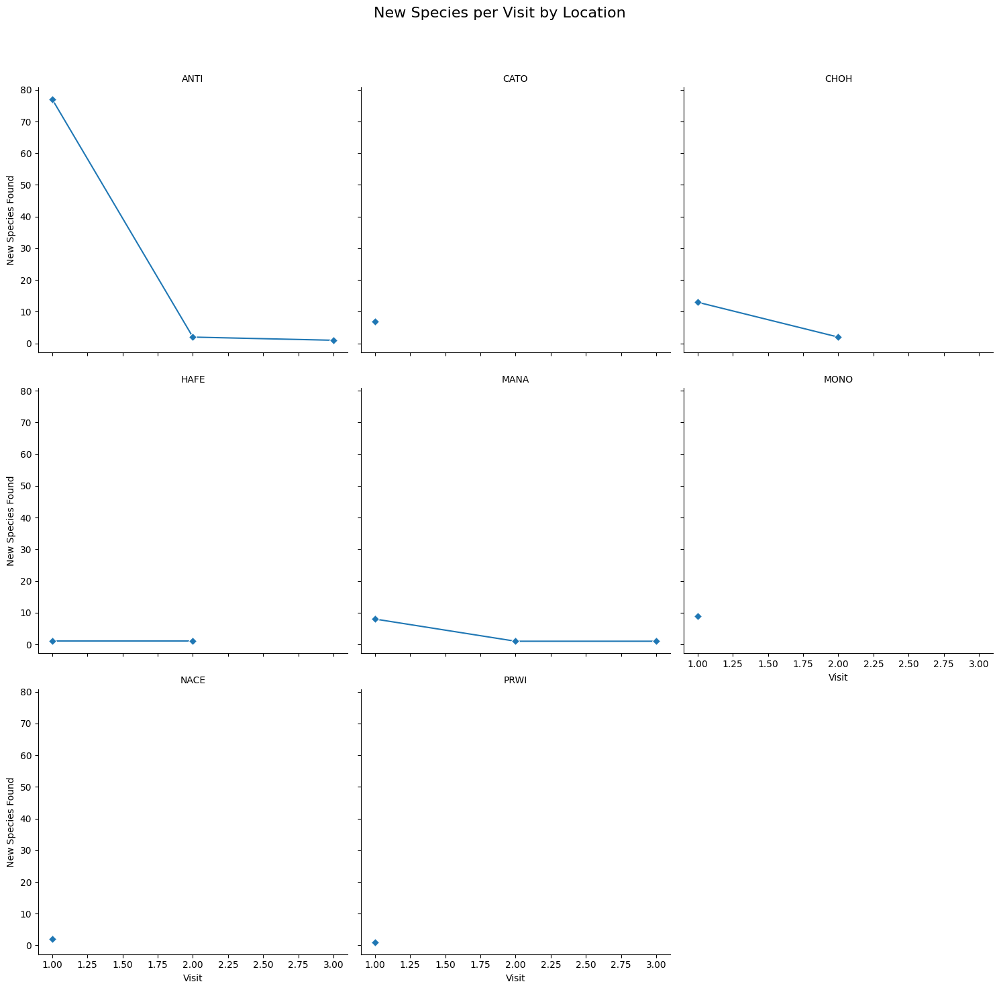

In [168]:
# First-Time Species Per Visit Per Location
# how many new species are added during each visit per location (discovery rate).

first_seen = (cleaned_df.groupby('Common_Name')[['Admin_Unit_Code', 'Visit']].min().reset_index())
first_seen_summary = (
    first_seen.groupby(['Admin_Unit_Code', 'Visit']).size()
    .reset_index(name='New_Species_This_Visit'))
g = sns.relplot(data=first_seen_summary,x='Visit',y='New_Species_This_Visit',col='Admin_Unit_Code',kind='line',
    marker='D',col_wrap=3)
g.set_titles('{col_name}')
g.set_axis_labels("Visit", "New Species Found")
g.figure.subplots_adjust(top=0.9)
g.figure.suptitle('New Species per Visit by Location', fontsize=16)
plt.show()

# Conservation Insights
## Watchlist Trends: Use the PIF_Watchlist_Status and Regional_Stewardship_Status to identify trends in species that are at risk or require conservation focus.

In [169]:
# Count of species by watchlist and stewardship status
watchlist_summary = (cleaned_df.groupby(['Common_Name', 'PIF_Watchlist_Status', 'Regional_Stewardship_Status']).size()
    .reset_index(name='Observation_Count'))
# watchlist_summary


In [170]:
watchlist_species = watchlist_summary[watchlist_summary['PIF_Watchlist_Status'] == True]
stewardship_species = watchlist_summary[watchlist_summary['Regional_Stewardship_Status'] == True]

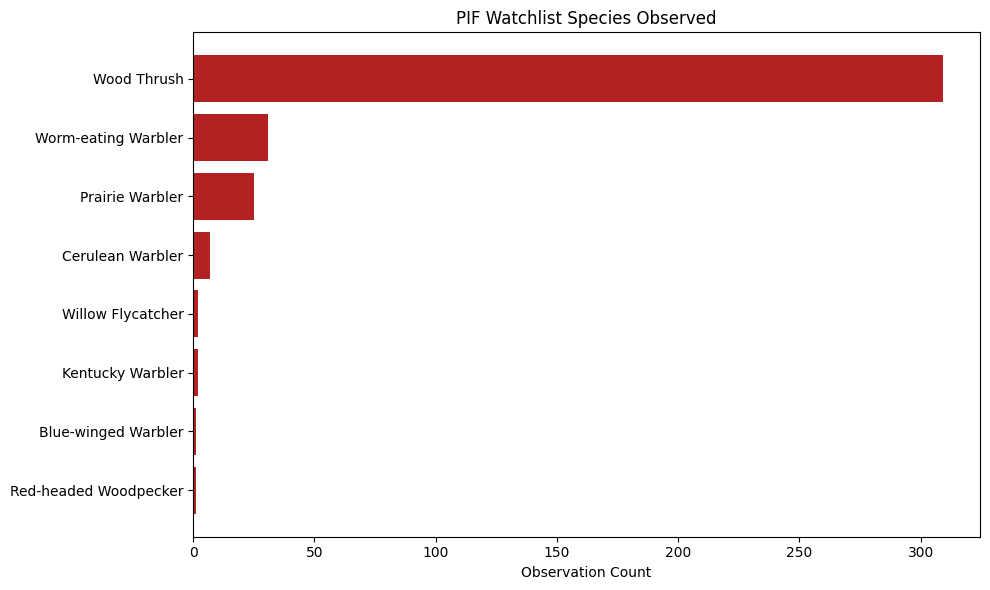

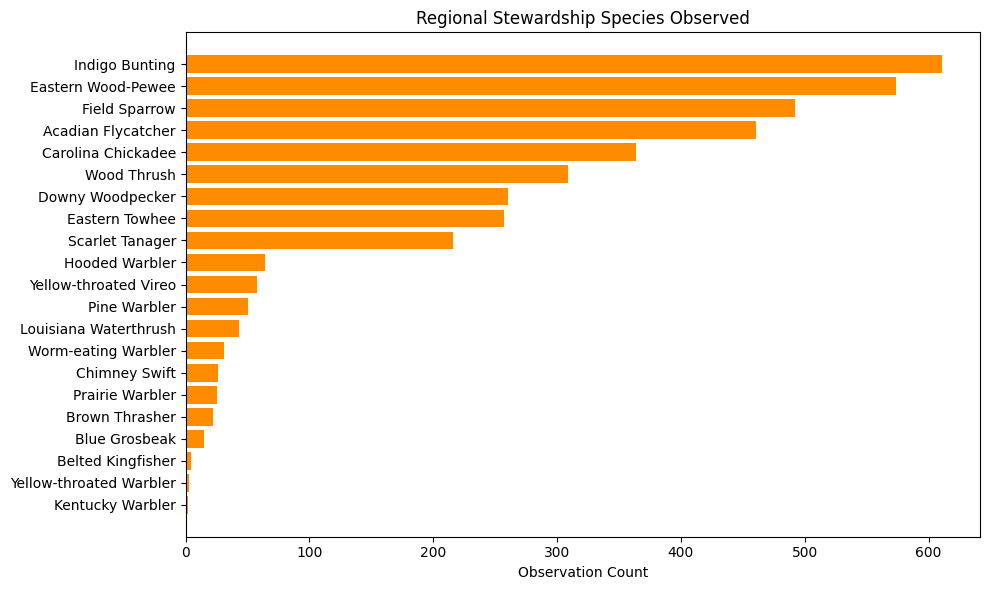

In [171]:
import matplotlib.pyplot as plt
top_watchlist = watchlist_species.sort_values('Observation_Count', ascending=False)
top_stewardship = stewardship_species.sort_values('Observation_Count', ascending=False)

# Plot PIF Watchlist Species
plt.figure(figsize=(10, 6))
plt.barh(top_watchlist['Common_Name'], top_watchlist['Observation_Count'], color='firebrick')
plt.xlabel('Observation Count')
plt.title('PIF Watchlist Species Observed')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Plot Stewardship Species
plt.figure(figsize=(10, 6))
plt.barh(top_stewardship['Common_Name'], top_stewardship['Observation_Count'], color='darkorange')
plt.xlabel('Observation Count')
plt.title('Regional Stewardship Species Observed')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


In [172]:
# Count how many species are flagged
pif_count = cleaned_df['PIF_Watchlist_Status'].sum()
regional_count = cleaned_df['Regional_Stewardship_Status'].sum()
both_count = cleaned_df[(cleaned_df['PIF_Watchlist_Status'] == True) & (cleaned_df['Regional_Stewardship_Status'] == True)].shape[0]

print(f"PIF Watchlist species: {pif_count}")
print(f"Regional Stewardship species: {regional_count}")
print(f"Species in both categories: {both_count}")

PIF Watchlist species: 378
Regional Stewardship species: 3887
Species in both categories: 367


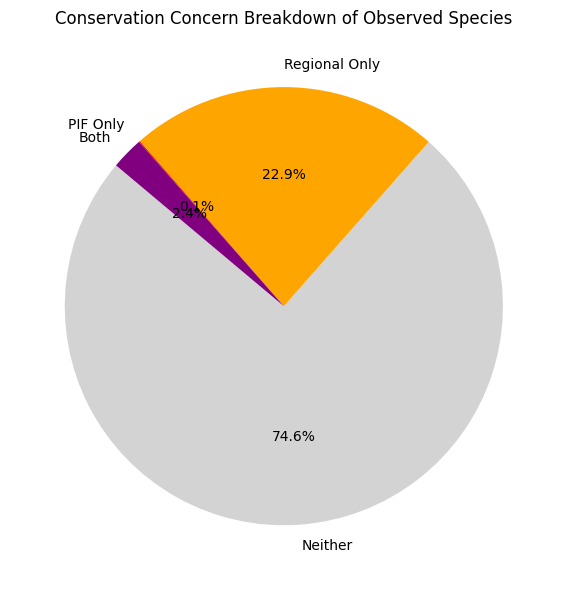

In [173]:
# Conservation Concern Breakdown of Observed Species
labels = ['Neither', 'Regional Only', 'PIF Only', 'Both']
sizes = [
    cleaned_df[(~cleaned_df['PIF_Watchlist_Status']) & (~cleaned_df['Regional_Stewardship_Status'])].shape[0],
    cleaned_df[(~cleaned_df['PIF_Watchlist_Status']) & (cleaned_df['Regional_Stewardship_Status'])].shape[0],
    cleaned_df[(cleaned_df['PIF_Watchlist_Status']) & (~cleaned_df['Regional_Stewardship_Status'])].shape[0],
    both_count]
colors = ['lightgray', 'orange', 'red', 'purple']
plt.figure(figsize=(8, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140)
plt.title('Conservation Concern Breakdown of Observed Species')
plt.tight_layout()
plt.show()


In [174]:
# Count how many times each species was observed
observation_counts = (cleaned_df.groupby(['Common_Name', 'PIF_Watchlist_Status', 'Regional_Stewardship_Status']).size()
    .reset_index(name='Observation_Count'))


In [175]:
# Categorize each species based on conservation flags
def classify_status(row):
    if row['PIF_Watchlist_Status'] and row['Regional_Stewardship_Status']:
        return 'Both'
    elif row['PIF_Watchlist_Status']:
        return 'PIF Only'
    elif row['Regional_Stewardship_Status']:
        return 'Regional Only'
    else:
        return 'Neither'

observation_counts['Conservation_Category'] = observation_counts.apply(classify_status, axis=1)


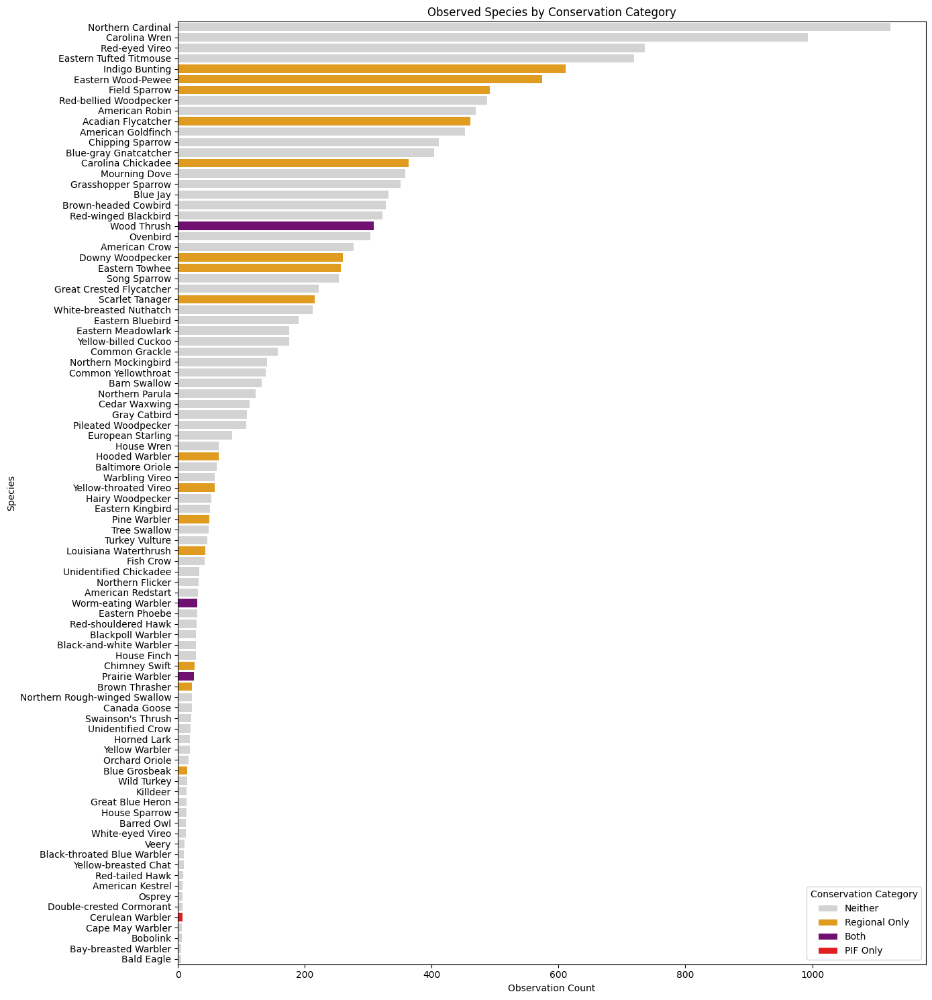

In [176]:
# Observed Species by Conservation Category
top_species = observation_counts.sort_values('Observation_Count', ascending=False).head(90)
plt.figure(figsize=(14, 15))
sns.barplot(data=top_species,x='Observation_Count',y='Common_Name',hue='Conservation_Category',
    palette={'Neither': 'lightgray', 'Regional Only': 'orange', 'PIF Only': 'red', 'Both': 'purple'})
plt.title('Observed Species by Conservation Category')
plt.xlabel('Observation Count')
plt.ylabel('Species')
plt.legend(title='Conservation Category', loc='lower right')
plt.tight_layout()
plt.show()

## AOU Code Patterns: Study the distribution of species based on their AOU_Code to correlate with regional or national conservation priorities.

In [177]:
cleaned_df['AOU_Code'].unique()

array(['CHSP', 'EABL', 'GRSP', 'FISP', 'AMCR', 'EAKI', 'INBU', 'NOCA',
       'MODO', 'EATO', 'SOSP', 'TRES', 'CARW', 'BLPW', 'BHCO', 'BAOR',
       'FICR', 'GCFL', 'AMRO', 'TUVU', 'RBWO', 'ETTI', 'CANG', 'BLJA',
       'CACH', 'GRCA', 'WOTH', 'UNCR', 'HOLA', 'EAWP', 'OROR', 'CEDW',
       'COYE', 'BGGN', 'ACFL', 'NOMO', 'COGR', 'BAEA', 'RWBL', 'EAME',
       'BARS', 'VESP', 'AMGO', 'BRTH', 'EAPH', 'UNCH', 'HOWR', 'HAWO',
       'WAVI', 'CHSW', 'BLVU', 'EUST', 'HOFI', 'NOFL', 'REVI', 'RTHA',
       'KILL', 'AMKE', 'SCTA', 'NOPA', 'WBNU', 'AMRE', 'BLGR', 'YBCU',
       'DOWO', 'PIWA', 'WODU', 'PIWO', 'HOSP', 'RSHA', 'PRAW', 'YBCH',
       'COHA', 'RTHU', 'RODO', 'NOCR', 'NRWS', 'YTVI', 'VEER', 'GBHE',
       'WITU', 'SUTA', 'WEVI', 'WIFL', 'OVEN', 'MAWA', 'SWTH', 'PUMA',
       'SASP', 'UNSW', 'CHPH', 'CSWA', 'BOBO', 'YEWA', 'UNFL', 'KEWA',
       'BEKI', 'UNWA', 'NOWA', 'BTNW', 'BAWW', 'WTSP', 'BADO', 'SWSP',
       'BBWA', 'CMWA', 'LEFL', 'HOWA', 'LOWA', 'WEWA', 'CERW', 'GRHE',
      

In [178]:
cleaned_df['AOU_Code'].nunique()

126

In [179]:
cleaned_df['AOU_Code'].value_counts()

AOU_Code
NOCA    1123
CARW     993
REVI     736
ETTI     719
INBU     611
        ... 
BWWA       1
PEFA       1
NAWA       1
TEWA       1
RHWO       1
Name: count, Length: 126, dtype: int64

In [180]:
# Filter to only conservation-priority species (Species by AOU Code and Location)
concern_df = cleaned_df[(cleaned_df['PIF_Watchlist_Status']) | (cleaned_df['Regional_Stewardship_Status'])]

# Create heatmap matrix: rows = AOU code groups, columns = locations
heatmap_data = (concern_df.groupby(['AOU_Code', 'Admin_Unit_Code']).size().unstack(fill_value=0))


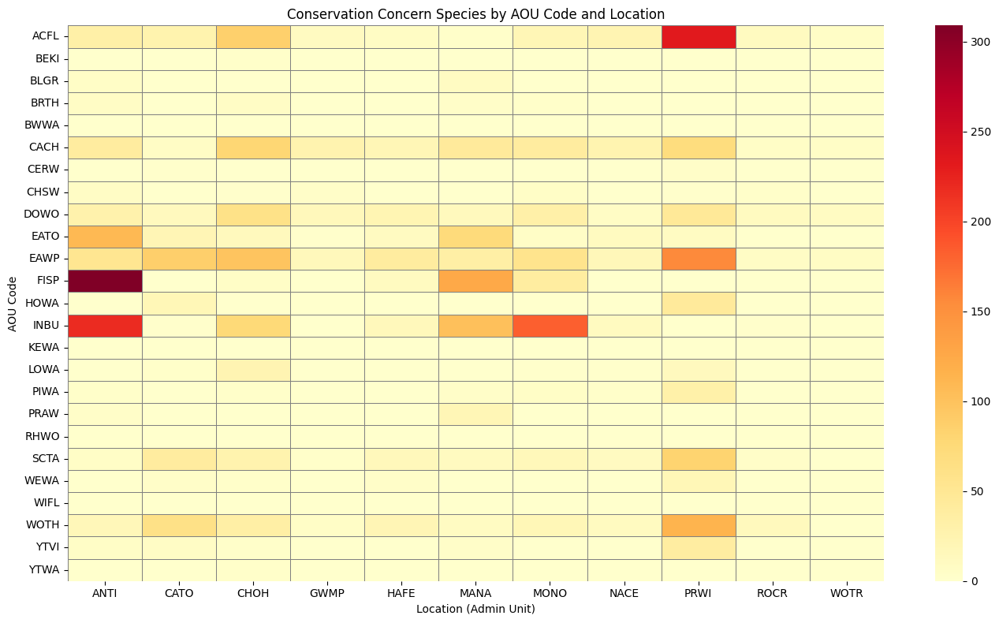

In [181]:
# Conservation Concern Species by AOU Code and Location
plt.figure(figsize=(14, 8))
sns.heatmap(heatmap_data, cmap='YlOrRd', linewidths=0.5, linecolor='gray')
plt.title('Conservation Concern Species by AOU Code and Location')
plt.xlabel('Location (Admin Unit)')
plt.ylabel('AOU Code')
plt.tight_layout()
plt.show()


In [182]:
# Sort species by AOU_Code
aou_df = cleaned_df[['Common_Name', 'AOU_Code', 'PIF_Watchlist_Status', 'Regional_Stewardship_Status']].drop_duplicates()

# Add combined conservation category
def classify_status(row):
    if row['PIF_Watchlist_Status'] and row['Regional_Stewardship_Status']:
        return 'Both'
    elif row['PIF_Watchlist_Status']:
        return 'PIF Only'
    elif row['Regional_Stewardship_Status']:
        return 'Regional Only'
    else:
        return 'Neither'

aou_df['Conservation_Category'] = aou_df.apply(classify_status, axis=1)

# Sort by AOU code
aou_df_sorted = aou_df.sort_values('AOU_Code')

In [183]:
# Create a pivot table: count of species per AOU_Code and Conservation_Category
heatmap_data = (aou_df_sorted.groupby(['AOU_Code', 'Conservation_Category']).size().unstack(fill_value=0))


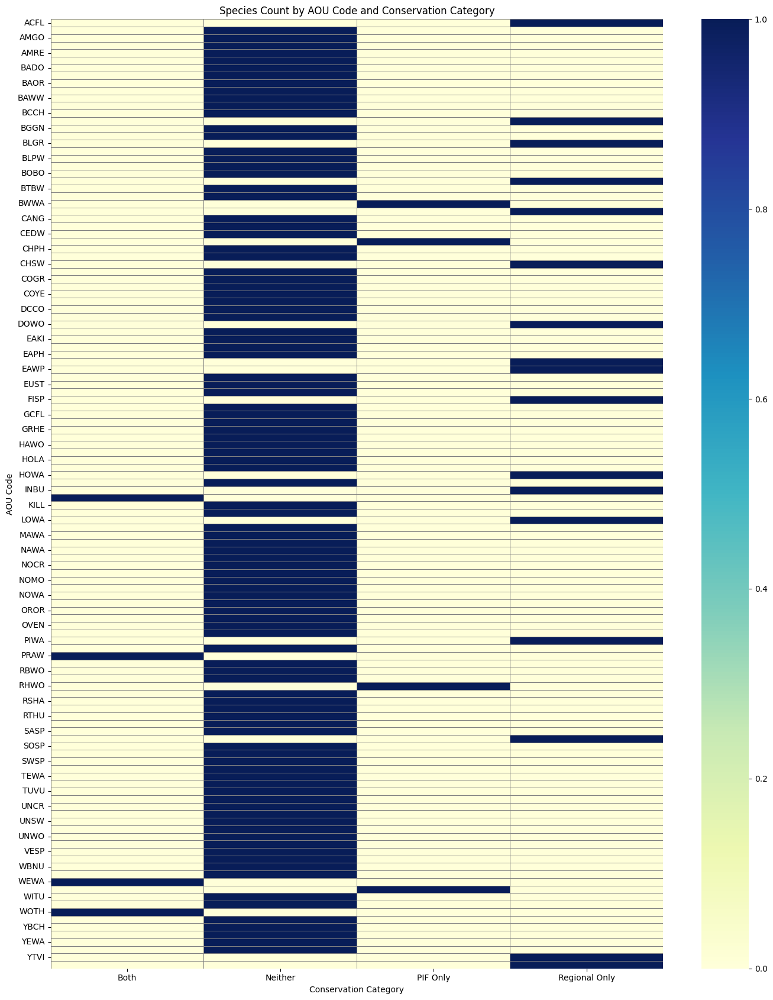

In [184]:
# Species Count by AOU Code and Conservation Category
plt.figure(figsize=(14, 17))
sns.heatmap(heatmap_data,cmap='YlGnBu',linewidths=0.5,linecolor='gray',fmt='d')
plt.title('Species Count by AOU Code and Conservation Category')
plt.xlabel('Conservation Category')
plt.ylabel('AOU Code')
plt.tight_layout()
plt.show()


In [185]:
cleaned_df.to_csv('species_analysis.csv')

In [186]:
cleaned_df.head()

,Admin_Unit_Code,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,Visit,ID_Method,...,Interval_End,Distance_Start,Distance_End,MonthName,Start_Hour,End_Hour,Mid_Hour,Hour_Bin,Interval_Duration,Distance_Mid
0,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,2.5,50,100,May,5.58,5.75,5.66,5:00–6:00,2.5,75.0
1,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,10.0,50,100,May,5.58,5.75,5.66,5:00–6:00,2.5,75.0
2,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,2.5,0,50,May,5.58,5.75,5.66,5:00–6:00,2.5,25.0
3,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,2.5,50,100,May,5.58,5.75,5.66,5:00–6:00,2.5,75.0
4,ANTI,ANTI-0054,Grassland,2018,2018-05-22,1900-01-01 05:35:00,1900-01-01 05:45:00,Elizabeth Oswald,1,Singing,...,2.5,50,100,May,5.58,5.75,5.66,5:00–6:00,2.5,75.0


In [187]:
cleaned_df.dtypes

Admin_Unit_Code                        object
Plot_Name                              object
Location_Type                          object
Year                                    int64
Date                           datetime64[ns]
Start_Time                     datetime64[ns]
End_Time                       datetime64[ns]
Observer                               object
Visit                                   int64
ID_Method                              object
Flyover_Observed                         bool
Sex                                    object
Common_Name                            object
Scientific_Name                        object
AOU_Code                               object
PIF_Watchlist_Status                     bool
Regional_Stewardship_Status              bool
Temperature                             int64
Humidity                                int64
Sky                                    object
Wind                                   object
Disturbance                       

# Database connection

In [188]:
import mysql.connector

mydb = mysql.connector.connect(
    host="localhost",
    user="root",
    password="",
    database="Bird_Species_data"   
)

mycursor = mydb.cursor(buffered=True)

In [189]:
# mycursor.execute("CREATE DATABASE Bird_Species_data")

In [196]:
mycursor.execute
("""
CREATE TABLE Species_analysis (
    Admin_Unit_Code CHAR(10),Plot_Name VARCHAR(50),
    Location_Type VARCHAR(50),Year INT,Date DATE,
    Start_Time datetime64,End_Time datetime64,Observer VARCHAR(50),
    Visit INT,ID_Method VARCHAR(50),Flyover_Observed BOOLEAN,
    Sex VARCHAR(50),Common_Name VARCHAR(50),Scientific_Name VARCHAR(50),
    AOU_Code VARCHAR(50),PIF_Watchlist_Status BOOLEAN,Regional_Stewardship_Status BOOLEAN,
    Temperature INT,Humidity INT,Sky VARCHAR(50),Wind VARCHAR(50),Disturbance VARCHAR(50),
    Sheet CHAR(10),Interval_Start FLOAT,Interval_End FLOAT,Distance_Start INT,
    Distance_End INT,MonthName CHAR(10),Start_Hour FLOAT,End_Hour FLOAT,
    Mid_Hour FLOAT,Hour_Bin,Interval_Duration FLOAT,Distance_Mid FLOAT
)
""")
mydb.commit()


In [191]:
from tabulate import tabulate

In [197]:
bird_analysis_query=("""
    INSERT INTO Species_analysis(Admin_Unit_Code, Plot_Name, Location_Type, Year, Date,
        Start_Time, End_Time, Observer, Visit, ID_Method,Flyover_Observed, Sex,
        Common_Name,Scientific_Name,AOU_Code,PIF_Watchlist_Status,Regional_Stewardship_Status, 
        Temperature,Humidity,Sky,Wind,Disturbance,Sheet,Interval_Start,
        Interval_End,Distance_Start,Distance_End,MonthName,
        Start_Hour,End_Hour,Mid_Hour,Hour_Bin,Interval_Duration,Distance_Mid) 
        VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, 
        %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, 
        %s, %s, %s, %s)""")

species_data = cleaned_df[['Admin_Unit_Code', 'Plot_Name', 'Location_Type', 'Year', 'Date',
       'Start_Time', 'End_Time', 'Observer', 'Visit', 'ID_Method',
       'Flyover_Observed', 'Sex', 'Common_Name', 'Scientific_Name', 'AOU_Code',
       'PIF_Watchlist_Status', 'Regional_Stewardship_Status', 'Temperature',
       'Humidity', 'Sky', 'Wind', 'Disturbance', 'Sheet', 'Interval_Start',
       'Interval_End', 'Distance_Start', 'Distance_End', 'MonthName',
       'Start_Hour', 'End_Hour', 'Mid_Hour', 'Hour_Bin', 'Interval_Duration',
       'Distance_Mid']].values.tolist()

batch_size = 100

for i in range(0, len(cleaned_df), batch_size):
    batch = cleaned_df.iloc[i:i+batch_size].values.tolist()
    mycursor.executemany(bird_analysis_query, batch)
    mydb.commit()

In [198]:
mycursor.execute("SELECT * FROM Species_analysis")
out=mycursor.fetchall()
print(tabulate(out, headers=[i[0] for i in mycursor.description],  tablefmt='psql'))

+-------------------+-------------+-----------------+--------+------------+---------------------+---------------------+------------------+---------+---------------+--------------------+--------------+-------------------------------+----------------------------+------------+------------------------+-------------------------------+---------------+------------+---------------------+--------------------------------------------+--------------------------+---------+------------------+----------------+------------------+----------------+-------------+--------------+------------+------------+------------+---------------------+----------------+
| Admin_Unit_Code   | Plot_Name   | Location_Type   |   Year | Date       | Start_Time          | End_Time            | Observer         |   Visit | ID_Method     |   Flyover_Observed | Sex          | Common_Name                   | Scientific_Name            | AOU_Code   |   PIF_Watchlist_Status |   Regional_Stewardship_Status |   Temperature |   Humidi

In [199]:
mycursor.execute("SELECT COUNT(*) FROM Species_analysis")
out=mycursor.fetchall()
print(tabulate(out, headers=[i[0] for i in mycursor.description],  tablefmt='psql'))

+------------+
|   COUNT(*) |
|------------|
|      15350 |
+------------+
